# COM6101 Group 1 code - site selection

## Data Sources

Here are the data for site selection:
* 2021 Hong Kong Census data (source: https://data.gov.hk/en-data/dataset/hk-censtatd-census_geo-2021-population-census-by-ssg )
* Hong Kong Restaurant License (source: https://data.gov.hk/en-data/dataset/hk-fehd-fehdlmis-restaurant-licences )
* Hong Kong Geocommunity (source: https://data.gov.hk/en-data/dataset/hk-landsd-openmap-development-hkms-digital-geocom/resource/0931b84b-f1c8-409f-9cd4-176a26645db0 ) 

## Data Processing

### 2021 HK Census Data

In [32]:
# transform HK Census Data from espg 2326 (HK coordinate system) to 4326 (WGS84)
import geopandas as gpd
import pandas as pd
from shapely.geometry import Polygon

gpdf = 'data/2021_census/LSUG_21C.json'

class transform_LSUG:
    def __init__(self, gpdf, epsg=2326, output_path='data/2021_census'):
        self.output_path = output_path
        self.gpdf = gpd.read_file(gpdf)
        self.epsg = epsg
    def transform(self):
        self.gpdf = self.gpdf.set_crs(epsg=self.epsg, allow_override=True)
        self.gpdf = self.gpdf.to_crs(epsg=4326)
        self.gpdf['name'] = self.gpdf.index
        self.gpdf = self.gpdf.explode()
        self.gpdf['geometry'] = self.gpdf['geometry'].apply(lambda x: Polygon(x.exterior.coords))
        return self.gpdf
    def export(self):
        self.transform()
        return self.gpdf.to_file(self.output_path + '/LSUG_21C_lat_lng.json', driver='GeoJSON')

transform_LSUG(gpdf).export()

C:\Users\kwokt\AppData\Local\Temp\ipykernel_25024\2574490307.py:17: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  self.gpdf = self.gpdf.explode()


Transform the HK Census data to preferred attributes:

In [33]:
import geopandas as gpd

LSUG = gpd.read_file('data/2021_census/LSUG_21C_lat_lng.json')
LSUG_copy = LSUG.copy()
LSUG_copy

,level_0,level_1,age_1,age_2,age_3,age_4,age_5,born_chi,born_else,born_hk,...,wp_n,wp_o,wp_p,wp_q,wp_r,wp_s,wp_se,wp_t,name,geometry
0,0,0,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.12554 22.28403, 114.12554 22.284..."
1,0,1,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.11267 22.28621, 114.11267 22.286..."
2,0,2,257,141,472,461,224,259,362,934,...,-,91,63,154,123,141,130,-,0,"POLYGON ((114.11683 22.28633, 114.11683 22.286..."
3,1,0,199,42,527,510,253,321,290,920,...,11,56,284,199,135,153,47,-,1,"POLYGON ((114.12668 22.28306, 114.12654 22.283..."
4,2,0,276,163,760,664,146,470,278,1261,...,62,36,250,187,203,101,50,25,2,"POLYGON ((114.12804 22.28329, 114.12791 22.283..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1962,1743,0,153,159,689,686,339,400,108,1518,...,16,56,53,227,340,158,82,14,1743,"POLYGON ((114.04878 22.28376, 114.04878 22.283..."
1963,1743,1,153,159,689,686,339,400,108,1518,...,16,56,53,227,340,158,82,14,1743,"POLYGON ((114.04416 22.28705, 114.04416 22.287..."
1964,1744,0,102,157,636,748,440,343,118,1622,...,45,22,90,284,186,109,131,31,1744,"POLYGON ((114.03342 22.29006, 114.03335 22.290..."
1965,1744,1,102,157,636,748,440,343,118,1622,...,45,22,90,284,186,109,131,31,1744,"POLYGON ((114.04349 22.29217, 114.04346 22.292..."


In [34]:
'''
calculate the mean of age in each subnit group
age_1 represents number of people in age 0-14, age_2 represents number of people in age 15-24,
age_3 represents number of people in age 25-44, age_4 represents number of people in age 45 - 64
age_5 represents number of people in age 65 or above, assume it is 65-84
Method of finding the mean of age in each subunit group:
1. multiply the number of people in each age group by the middle value of the age group
2. sum up the result of each age group
3. divide the sum by the total number of people in the subunit group
'''
# input all '-' to 0 first
LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']] = LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']].replace('-', '0')

# change dtype from int to float
LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']] = LSUG_copy[['age_1', 'age_2', 'age_3', 'age_4', 'age_5']].astype('float')

LSUG_copy['mean_age'] = LSUG_copy['age_1'] * 7 + LSUG_copy['age_2'] * 19.5 + LSUG_copy['age_3'] * 34.5 + LSUG_copy['age_4'] * 54.5 + LSUG_copy['age_5'] * 74.5
# median age is the age of the middle person in the subunit group, find the median age of each subunit group first by dividing the total number of people in the subunit group by 2
LSUG_copy['median_age'] = (LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']) / 2
LSUG_copy['median_age'] = LSUG_copy['median_age'].astype('int')

# look the median is situated in which age group, then find the middle value of the age group
LSUG_copy.loc[LSUG_copy['median_age'] <= LSUG_copy['age_1'], 'median_age'] = 7 # age_1
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2']), 'median_age'] = 20 # age_2
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3']), 'median_age'] = 35 # age_3
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4']), 'median_age'] = 55 # age_4
LSUG_copy.loc[(LSUG_copy['median_age'] > LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4']) & (LSUG_copy['median_age'] <= LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']), 'median_age'] = 75 # age_5

LSUG_copy['mean_age'] = LSUG_copy['mean_age'] / (LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5'])

# reduce the effect of outliers of mean age
LSUG_copy['mean_median_age'] = LSUG_copy['mean_age'] * 0.5 + LSUG_copy['median_age'] * 0.5
LSUG_copy[['mean_age', 'median_age', 'mean_median_age']].describe()

,mean_age,median_age,mean_median_age
count,1967.000000,1967.000000,1967.000000
mean,43.942314,45.810880,44.876597
std,3.833918,10.043943,6.564367
min,29.875228,20.000000,24.937614
25%,41.319854,35.000000,38.249683
50%,43.811919,55.000000,48.813066
75%,46.581901,55.000000,50.781901
max,65.826733,75.000000,70.413366


In [35]:
# total population is the sum of age_1, age_2, age_3, age_4, age_5
LSUG_copy['total_population'] = LSUG_copy['age_1'] + LSUG_copy['age_2'] + LSUG_copy['age_3'] + LSUG_copy['age_4'] + LSUG_copy['age_5']
LSUG_copy['total_population'].describe()

count     1967.000000
mean      4083.156075
std       4687.779911
min       1000.000000
25%       1595.500000
50%       2208.000000
75%       4311.500000
max      39767.000000
Name: total_population, dtype: float64

In [36]:
# median of income is in ma_hh
LSUG_copy['median_hs_income'] = LSUG_copy['ma_hh']
LSUG_copy['median_hs_income'].value_counts()

median_hs_income
63820    57
47850    43
17000    28
47070    19
20040    17
         ..
40560     1
86240     1
89870     1
62140     1
82290     1
Name: count, Length: 1286, dtype: int64

In [37]:
# mean household size: total_population / dh
# convert dh '-' to 1
LSUG_copy['dh'] = LSUG_copy['dh'].replace('-', '1')
LSUG_copy['dh'] = LSUG_copy['dh'].astype('float')
LSUG_copy['mean_hs_size'] = LSUG_copy['total_population'] / LSUG_copy['dh']
# for rows where 'dh' = 1, set mean_hs_size = 1
LSUG_copy.loc[LSUG_copy['dh'] == 1, 'mean_hs_size'] = 1
# find row where 'mean_hs_size' > 10, set mean_hs_size = 10
LSUG_copy.loc[LSUG_copy['mean_hs_size'] > 10, 'mean_hs_size'] = 10
LSUG_copy['mean_hs_size'].describe()

count    1967.000000
mean        2.854699
std         0.592379
min         1.000000
25%         2.484750
50%         2.782135
75%         3.095936
max        10.000000
Name: mean_hs_size, dtype: float64

In [38]:
# % in labour force: t_wp / total_population
# transform '-' to 0
LSUG_copy['t_wp'] = LSUG_copy['t_wp'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['t_wp'] = LSUG_copy['t_wp'].astype('float')
LSUG_copy['labour_force_percent'] = LSUG_copy['t_wp'] / LSUG_copy['total_population']
LSUG_copy['labour_force_percent'].describe()

count    1967.000000
mean        0.510765
std         0.067052
min         0.000000
25%         0.471007
50%         0.515250
75%         0.555184
max         0.785621
Name: labour_force_percent, dtype: float64

In [39]:
# % of Chinese: ethn_chi / total_population
# transform '-' to 0
LSUG_copy['ethn_chi'] = LSUG_copy['ethn_chi'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['ethn_chi'] = LSUG_copy['ethn_chi'].astype('float')
LSUG_copy['chinese_percent'] = LSUG_copy['ethn_chi'] / LSUG_copy['total_population']
LSUG_copy['chinese_percent'].describe()

count    1967.000000
mean        0.863458
std         0.133182
min         0.263777
25%         0.817618
50%         0.915462
75%         0.955576
max         1.000000
Name: chinese_percent, dtype: float64

In [40]:
# % of Male: pop_m / total_population
# transform '-' to 0
LSUG_copy['pop_m'] = LSUG_copy['pop_m'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['pop_m'] = LSUG_copy['pop_m'].astype('float')
LSUG_copy['pop_m_percent'] = LSUG_copy['pop_m'] / LSUG_copy['total_population']
LSUG_copy['pop_m_percent'].describe()

count    1967.000000
mean        0.452532
std         0.044367
min         0.298851
25%         0.428301
50%         0.454599
75%         0.476916
max         0.888457
Name: pop_m_percent, dtype: float64

In [41]:
# % of owner owned property: ten_oc / LSUG_copy['dh']
# transform '-' to 0
LSUG_copy['ten_oc'] = LSUG_copy['ten_oc'].replace('-', '0')
# transform dtype from str to float
LSUG_copy['ten_oc'] = LSUG_copy['ten_oc'].astype('float')
LSUG_copy['ten_oc_percent'] = LSUG_copy['ten_oc'] / LSUG_copy['dh']
LSUG_copy['ten_oc_percent'].describe()

count    1967.000000
mean        0.532857
std         0.246771
min         0.000000
25%         0.410584
50%         0.550868
75%         0.721917
max         1.000000
Name: ten_oc_percent, dtype: float64

In [42]:
# rent to income ratio: dmr_ir
# transform from object to float
import pandas as pd
LSUG_copy['rent_to_income_ratio'] = pd.to_numeric(LSUG_copy['dmr_ir'], errors='coerce')
LSUG_copy.loc[(LSUG_copy['rent_to_income_ratio'] > 100), 'rent_to_income_ratio'] = 100
LSUG_copy['rent_to_income_ratio'] = LSUG_copy['rent_to_income_ratio'] / 100
LSUG_copy['rent_to_income_ratio'].describe()

count    1900.000000
mean        0.283352
std         0.117332
min         0.020000
25%         0.219000
50%         0.289000
75%         0.346000
max         1.000000
Name: rent_to_income_ratio, dtype: float64

In [50]:
# export used columns to json file, rename 'name' to 'census_subnit' first
LSUG_copy = LSUG_copy.rename(columns={'name': 'census_subnit'})
# used columns: 'subunit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry'
LSUG_copy[['census_subnit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry']].to_file('data/2021_census/LSUG_21C_cleaned.json', driver='GeoJSON')

In [51]:
# preview the cleaned data
LSUG_copy[['census_subnit', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'geometry']].head()

,census_subnit,mean_median_age,median_hs_income,mean_hs_size,labour_force_percent,chinese_percent,pop_m_percent,ten_oc_percent,rent_to_income_ratio,geometry
0,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.12554 22.28403, 114.12554 22.284..."
1,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.11267 22.28621, 114.11267 22.286..."
2,0,37.643087,51370,3.031189,0.506109,0.779421,0.518971,0.670565,0.273,"POLYGON ((114.11683 22.28633, 114.11683 22.286..."
3,1,39.393207,55680,2.244868,0.640758,0.835402,0.430438,0.478006,0.295,"POLYGON ((114.12668 22.28306, 114.12654 22.283..."
4,2,37.011075,50040,2.272624,0.578895,0.837730,0.446491,0.573529,0.252,"POLYGON ((114.12804 22.28329, 114.12791 22.283..."


### Restaurant License Data

In [44]:
# transfer xml to csv for restaurant licence data
import os
import xml.etree.ElementTree as Xet
import pandas as pd

folder_path = 'data/restaurant_license/xml'
output_folder = 'data/restaurant_license/csv'

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

cols = ["TYPE", "DIST", "LICNO", "SS", "ADR", "INFO", "EXPDATE"]

# Iterate through all XML files in the folder_path
for filename in os.listdir(folder_path):
    if filename.endswith(".XML"):
        xml_file = os.path.join(folder_path, filename)
        csv_file = os.path.join(output_folder, os.path.splitext(filename)[0][1:] + ".csv")
        rows = []
        xmlparse = Xet.parse(xml_file)
        # The data are stored in the <LPS> tag
        root = xmlparse.getroot().find("LPS")

        for i in root:
            
            TYPE = i.find("TYPE").text
            DIST = i.find("DIST").text
            LICNO = i.find("LICNO").text
            SS = i.find("SS").text
            ADR = i.find("ADR").text
            INFO = i.find("INFO").text
            EXPDATE = i.find("EXPDATE").text
            rows.append({"TYPE": TYPE, "DIST": DIST, "LICNO": LICNO, 
                         "SS": SS, "ADR": ADR, "INFO": INFO, "EXPDATE": EXPDATE})

        df = pd.DataFrame(rows, columns=cols)
        df.to_csv(csv_file, index=False)
        print(f"Converted {filename} to {os.path.splitext(filename)[0][1:] + '.csv'}")

print("XML to CSV conversion completed.")

Converted 20230101-1033-LP_Restaurants_EN.XML to 0230101-1033-LP_Restaurants_EN.csv
Converted 20240101-1050-LP_Restaurants_EN.XML to 0240101-1050-LP_Restaurants_EN.csv
XML to CSV conversion completed.


In [3]:
# geocoding for restaurant licence data
import os
import pandas as pd
import geocoder

API_KEY = "AAPKae2a40767592460cb54f98756c8579053czHfV2nsyRUZFSbUVLCBS1poOYx5GBSCwaj9nhJL3yjZggs94pMrjDgZtoZhg-0"

folder_path = 'data/restaurant_license/csv'
output_folder = 'data/restaurant_license/geo'

# create output folder if not exist
if not os.path.exists(output_folder):
    os.mkdir(output_folder)

# Iterate through all CSV files in the folder_path
# columns: TYPE, DIST, LICNO, SS, ADR, INFO, EXPDATE
# column ADR is the address

# use old csv file to reference if address already exist
old_file = 'data/restaurant_license/geo/geo_full.csv'

for filename in os.listdir(folder_path):
    # only retrive csv file and file not end with .finished.csv
    if filename.endswith(".csv") and not filename.endswith(".finished.csv"):
        print(f'start converting {filename} to geo location')
        csv_file = os.path.join(folder_path, filename)
        geo_file = os.path.join(output_folder, filename + ".geo.csv")
        # transform ADR to upper case first
        df = pd.read_csv(csv_file, encoding='utf-8')
        df['ADR'] = df['ADR'].str.upper()
        # add new columns for geo location
        lat = []
        lng = []
        df.reset_index(inplace=True, drop=True)
        # check if df['ADR'] == old_df['ADR']
        old_df = pd.read_csv(old_file, encoding='utf-8')
        for i in range(len(df)):
            if df['ADR'][i] in old_df['ADR'].values:
                # if address already exist in old_df, then use the geo location in old_df
                lat.append(old_df.loc[old_df['ADR'] == df['ADR'][i], 'lat'].iloc[0])
                lng.append(old_df.loc[old_df['ADR'] == df['ADR'][i], 'lng'].iloc[0])
                print(f"Converted {df['ADR'][i]} to {old_df.loc[old_df['ADR'] == df['ADR'][i], 'lat'].iloc[0]}, {old_df.loc[old_df['ADR'] == df['ADR'][i], 'lng'].iloc[0]}, by referencing old csv file")
                continue
            g = geocoder.arcgis(df['ADR'][i], key = API_KEY)
            lat.append(g.lat)
            lng.append(g.lng)
            print(f"Converted {df['ADR'][i]} to {g.lat}, {g.lng}")
        df['lat'] = lat
        df['lng'] = lng
        df.to_csv(geo_file, index=False)
        # rename the original csv file to finished
        os.rename(csv_file, os.path.join(folder_path, filename + "_finished.csv"))
        print(f"Converted {filename} to {filename}")
print("All csv files converted to geo location")

start converting 0230101-1033-LP_Restaurants_EN.csv_finished.csv to geo location
Converted JUMBO FLOATING RESTAURANT, ABERDEEN TYPHOON SHELTER, SHUM WAN, WONG CHUK HANG, SOUTHERN, HONG KONG to 22.2457973, 114.155256, by referencing old csv file
Converted TAI PAK FLOATING RESTAURANT, SHUM WAN, WONG CHUK HANG, ABERDEEN, SOUTHERN, HONG KONG to 22.24329000000006, 114.16203000000009, by referencing old csv file
Converted MAN LOK (VESSEL NO. A5583) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) PASSENGER FERRY PIER, NORTH POINT, HONG KONG to 22.2884683, 114.192803, by referencing old csv file
Converted MAN ON (VESSEL NO. A10363) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) PASSENGER FERRY PIER, NORTH POINT, HONG KONG to 22.2884683, 114.192803, by referencing old csv file
Converted MAN KIM (VESSEL NO. A2463) (PORTION OF UPPER DECK & PORTIONS OF MAIN DECK OF THE VESSEL) BERTHING AT NORTH POINT (EAST) 

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 2107, LEVEL 2, MOSTOWN, NO. 18 ON LUK STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to None, None
Converted STALL NO.28, G/F, HENG ON MARKET, HENG ON ESTATE, NO.1 HANG KAM STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.416747679196646, 114.22796107559832, by referencing old csv file
Converted MAJOR PORTION OF COOKED FOOD STALL NOS. 1, 2, 3 & 4 AND THE OUTSIDE SEATING ACCOMODATION AT SHOP FRONT, SUN TIN WAI SHOPPING CENTRE, SUN TIN WAI ESTATE, NO. 29 SHA TIN TAU ROAD, SHA TIN, NEW TERRITORIES to nan, nan, by referencing old csv file
Converted SHOP 152, 1/F,  KINGS WING PLAZA I, NO. 3 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to 22.38780861365973, 114.20778533174088, by referencing old csv file


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP G11, G/F, KINGS WING PLAZA 2, 1 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP ST-01-008, PORTIONS OF LEVEL 1, NEW TOWN PLAZA III, 2-8 SHATIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.3792520316221, 114.18791100112156, by referencing old csv file
Converted SHOP A238, LEVEL 2, NEW TOWN PLAZA, PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP NO.6, G/F, KAM SHAN BUILDING,  1-35 TAI WAI ROAD, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274, by referencing old csv file
Converted SHOP NO. A237, LEVEL 2, NEW TOWN PLAZA (PHASE III), SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP NO. A236, LEVEL 2, NEW TOWN PLAZA PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006, by referencing old csv file
Converted SHOP ST-01-005, PORTIONS OF LEVEL 1, NEW TOWN PLAZA III, 2-8 SHATIN

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted LEVEL 1, COFFEE SHOP & SITTING LOUNGE AND THE OUTSIDE SEATING ACCOMMODATION AT SIDE, ROYAL PARK HOTEL, 8 PAK HOK TING STREET, STTL 183, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NO. 251-252, 2/F, WO CHE COMMERCIAL CENTRE, NO. 3 TAK HAU STREET, SHA TIN, NEW TERRITORIES to 22.387412820191784, 114.19540249472271, by referencing old csv file
Converted SHOP NO. 2129, LEVEL 2, MOSTOWN, NO. 18 ON LUK STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.424533712875345, 114.23240214317684, by referencing old csv file
Converted SHOP NO. F3, 1/F, MEI LAM SHOPPING CENTRE, MEI LAM ESTATE, 30 MEI TIN ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37820546719162, 114.17637976546604, by referencing old csv file
Converted UNIT RT-G01, G/F, BUILDING 17W, HONG KONG SCIENCE PARK, PAK SHEK KOK, NEW TERRITORIES to 22.42673182507359, 114.2086951873306, by referencing old csv file
Converted SHOP D, G/F, JAT MIN CHUEN, 7 JAT MIN CHUEN STREET, SHA TIN, NEW TERRITORIES to 22.376471921976872, 

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 117A, 1/F, FORTUNE CITY ONE, CITY ONE, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NOS. 3078 AND 3079, LEVEL 3 , LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to 22.383416831671923, 114.19009532508908, by referencing old csv file
Converted MAJOR PORTION OF SHOP 50, 3/F, SHA TIN PLAZA SHOPPING ARCADE, 21-27 SHA TIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.38310000000007, 114.18941000000008, by referencing old csv file
Converted SHOP G08A, G/F, WE GO MALL, 16 PO TAI STREET, MA ON SHAN, NEW TERRITORIES to 22.41412012018921, 114.22391278400266, by referencing old csv file
Converted SHOP NO. 205, 2/F, SHUI CHUEN O PLAZA, SHUI CHUEN O ESTATE, SHA TIN, NEW TERRITORIES to 22.37383220920984, 114.1970856646994, by referencing old csv file
Converted SHOP G21, G38, G39 & G40, G/F, KINGS WING PLAZA 2, 1 ON KWAN STREET, SHEK MUN, SHA TIN, NEW TERRITORIES to 22.388932668785078, 114.20878076656196, by referencing old csv file
Converted SHOP NOS. 3093 & 3

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 312, 3/F, HENG ON SHOPPING CENTRE, HENG ON ESTATE,  MA ON SHAN, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NOS. 3091-3092, LEVEL 3, LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to 22.383416831671923, 114.19009532508909


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP 3090, LEVEL 3, LUCKY PLAZA, 1-15 WANG POK STREET, SHA TIN, NEW TERRITORIES to None, None
Converted UNIT S003C, G/F, BUILDING 1E, PHASE ONE, HONG KONG SCIENCE PARK, PAK SHEK KOK, SHA TIN, NEW TERRITORIES to 22.36641827400007, 114.17238419500006
Converted SHOP G17 & G43, G/F, KINGS WING PLAZA 2, NO. 1 ON KWAN STREET, SHA TIN, NEW TERRITORIES to 22.388932668785078, 114.20878076656196, by referencing old csv file


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted PORTION OF SHOP B AND PORTION OF SHOP C ON G/F, TAI ON BUILDING, NOS. 41, 45, 47, & 51 TSUEN NAM ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP 4, L1 FLOOR, HORIZON SUITE HOTEL, NO. 29 ON CHUN STREET, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.42641582732388, 114.22741616807292
Converted SHOP 6A AND 6B, GROUND FLOOR, CHUNG ON SHOPPING CENTRE, CHUNG ON ESTATE, MA ON SHAN, SHA TIN, NEW TERRITORIES to 22.421762404228446, 114.22658795222014
Converted SHOP G18, G/F, KINGS WING PLAZA 2, NO. 1 ON KWAN STREET,  SHEK MUN, SHA TIN, NEW TERRITORIES to 22.388932668785074, 114.20878076656197
Converted SHOP A327, LEVEL 3, NEW TOWN PLAZA PHASE III, SHA TIN, NEW TERRITORIES to 22.38024000000007, 114.18761000000006
Converted SHOP NO. G97-G100, G/F, FORTUNE CITY ONE, SHA TIN, NEW TERRITORIES to 22.385895695717025, 114.20399293964914


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP 8 & 9, 1/F, COMMERCIAL BLOCK 2, (FORMING PART  OF COMMERCIAL COMPLEX), (ALSO KNOWN AS KWONG YUEN SHOPPING CENTRE), KWONG YUEN ESTATE, 68 SIU LEK YUEN ROAD, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP NO. 233, 2/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP G22-G30, G/F, PLAZA ASCOT, 1 TSUN KING ROAD, FO TAN, SHA TIN, NEW TERRITORIES to 22.398940283990896, 114.20121308146099
Converted SHOP G-3/48, G/F, MOSTOWN STREET, MA ON SHAN, NEW TERRITORIES to 22.42406000000005, 114.23149, by referencing old csv file
Converted SHOP UNIT 519, 5/F, THE WAI, COMMERCIAL DEVELOPMENT AT TAI WAI STATION, SHA TIN TOWN LOT NO. 520, SHA TIN, NEW TERRITORIES to 22.373154155152463, 114.17852276665087


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 227, 2/F, WO CHE COMMERCIAL CENTRE, NO. 3 TAK HAU STREET, SHA TIN, NEW TERRITORIES to None, None


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP UNIT 520, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP 218, 2/F , THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted UNIT B, G/F, SUI FUNG MANSION, NOS. 1-15 CHIK SHUN STREET, TAI WAI, SHA TIN, NEW TERRITORIES to 22.376056137669863, 114.17745214615832
Converted SHOP UNIT 434, 4/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted MAJOR PORTION OF SHOP UNIT 335, 3/F, THE WAI, NO. 18 CHE KUNG MIU ROAD, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 501, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted UNIT 304, 3/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP NO. 232, 2/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP UNIT 305, 3/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274


Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted SHOP UNIT 433A, 4/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to None, None
Converted SHOP UNIT 426A, 4/F, THE WAI, TAI WAI, SHA TIN, NEW TERRITORIES to 22.37582626397527, 114.17709164050274
Converted SHOP UNITS 431-432 AND SEATING AREA OPPOSITE SHOP  UNITS 431-432, LEVEL 4, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP 165, LEVEL 1, PHASE 1, NEW TOWN PLAZA, 18 SHA TIN CENTRE STREET, SHA TIN, NEW TERRITORIES to 22.382111140704765, 114.18818860975477
Converted PORTION OF UNIT 325, 3/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, SHA TIN, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 528, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 527, 5/F, THE WAI, 18 CHE KUNG MIU ROAD, TAI WAI, NEW TERRITORIES to 22.373436164284797, 114.18045370568541
Converted SHOP UNIT 332, THE WAI, SHA TIN TOWN LOT. NO. 520, SHA TIN

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


Converted G/F, NO. 17 TSING FUNG STREET, NORTH POINT, HONG KONG to None, None
Converted G/F., NO. 3 LAN FONG ROAD, CAUSEWAY BAY, HONG KONG to 22.278611358384893, 114.18395834704114
Converted GROUND FLOOR & PORTION OF COCKLOFT, NO. 49 JARDINE'S BAZAAR, CAUSEWAY BAY, HONG KONG to 22.279292178470314, 114.18535158698694
Converted SHOP NO. 1 & 2, G/F, HENNING HOUSE, 385-391 HENNESSY ROAD, WAN CHAI, HONG KONG to 22.27918107634372, 114.18008817088793
Converted SHOP KL-3, G/F, MAYSON GARDEN BUILDING, NOS. 62, 64, 66, 70, 72 & 74 HING FAT STREET, NOS. 2A-2E WING HING STREET & NOS. 1A-1B TSING FUNG STREET, NORTH POINT, HONG KONG to 22.284970037771842, 114.19119821590891
Converted 20/F., SUGAR+, 31 SUGAR STREET, CAUSEWAY BAY, HONG KONG to 22.280112431515064, 114.18691062097759
Converted SHOP 3B, 3/F., CAUSEWAY BAY PLAZA 2, NOS. 463-483 LOCKHART ROAD, CAUSEWAY BAY, HONG KONG to 22.280543219428765, 114.18208541077661
Converted 26/F, L'HART, 487-489 LOCKHART ROAD, CAUSEWAY BAY, HONG KONG to 22.28076

In [4]:
# map the restaurant licence data to its relative HK census polygon TPU
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
import os

class map_census_polygon_restaurant:
    def __init__(self, census_polygon, restaurant_path, output_folder, restaurant_name):
        self.census_polygon = gpd.read_file(census_polygon)
        self.restaurant_path = restaurant_path
        self.restaurant_name = restaurant_name
        self.output_folder = output_folder
    def map(self):
        restaurant = pd.read_csv(self.restaurant_path + self.restaurant_name)
        # if restaurant['lat'] and restaurant['lng'] are contained in census_polygon['geometry'], then the restaurant is in the census polygon
        try:
            restaurant['census_subnit'] = restaurant.apply(lambda row: self.census_polygon[self.census_polygon['geometry'].contains(Point(row['lng'], row['lat']))]['name'].values[0], axis=1) 
        except:
            restaurant['census_subnit'] = restaurant.apply(lambda row: self.census_polygon[self.census_polygon['geometry'].contains(Point(row['lng'], row['lat']))]['name'].values, axis=1)
        # if restaurant['census_subnit'] is a list, then only keep the first element
        restaurant['census_subnit'] = restaurant['census_subnit'].str[0]
        # export the mapped restaurant to csv, named as the file name of the original restaurant csv file to output_folder
        if not os.path.exists(self.output_folder):
            os.makedirs(self.output_folder, exist_ok=True)
        return restaurant.to_csv(self.output_folder + self.restaurant_name.replace('.csv.geo.csv', '') + '_geo_mapped.csv', index=False), print(f"Restaurant {self.restaurant_name} mapped to census polygon")
    
# loop all the restaurant csv files in folder restaurant-info-hk/geo, and map them to census polygon
census_polygon = 'data/2021_census/LSUG_21C_lat_lng.json'
restaurant_path = 'data/restaurant_license/geo/'
output_folder = 'data/restaurant_license/geo_mapped/'
for restaurant_name in os.listdir(restaurant_path):
    map_census_polygon_restaurant(census_polygon, restaurant_path, output_folder, restaurant_name).map()

Restaurant 0230101-1033-LP_Restaurants_EN.csv mapped to census polygon
Restaurant 0240101-1050-LP_Restaurants_EN.csv mapped to census polygon
Restaurant geo_full copy.csv mapped to census polygon
Restaurant geo_full.csv mapped to census polygon


In [6]:
# preview the mapped restaurant data
restaurant_mapped = pd.read_csv('data/restaurant_license/geo_mapped/0230101-1033-LP_Restaurants_EN.csv')
restaurant_mapped.head()

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit
0,MR,15,3715038319,Jumbo,"JUMBO FLOATING RESTAURANT, ABERDEEN TYPHOON SH...",#F#G#H,2023-06-30,22.245797,114.155256,NaN
1,MR,15,3715038328,Tai Pak Floating Restaurant,"TAI PAK FLOATING RESTAURANT, SHUM WAN, WONG CH...",#F#G#H,2023-06-30,22.243290,114.162030,NaN
2,MR,11,3711800024,Man Lok,MAN LOK (VESSEL NO. A5583) (PORTION OF UPPER D...,#H,2023-04-22,22.288468,114.192803,180.0
3,MR,11,3711800033,Man On,MAN ON (VESSEL NO. A10363) (PORTION OF UPPER D...,#H,2023-06-24,22.288468,114.192803,180.0
4,MR,11,3711800042,Man Kim,MAN KIM (VESSEL NO. A2463) (PORTION OF UPPER D...,#H,2023-09-19,22.288468,114.192803,180.0


In [3]:
# compare 2023 with 2024: if the restaurant in 2023 is also in 2024, then it is a survive restaurant, marked 1 in column 'survive'
import pandas as pd

# create a survive column in the restaurant dataset
df_2023 = pd.read_csv('data/restaurant_license/geo_mapped/0230101-1033-LP_Restaurants_EN.csv')
df_2024 = pd.read_csv('data/restaurant_license/geo_mapped/0240101-1050-LP_Restaurants_EN.csv')

def compare_survive(df_2023, df_2024):
    df_2023['survive'] = 0
    for i in range(len(df_2023)):
        if df_2023['ADR'][i] in df_2024['ADR'].values and df_2023['SS'][i] in df_2024['SS'].values:
            df_2023['survive'][i] = 1
    return df_2023.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False), print('survive column added to 0230101-1033-LP_Restaurants_EN.csv')

compare_survive(df_2023, df_2024)

C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData

survive column added to 0230101-1033-LP_Restaurants_EN.csv


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\2407676747.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023['survive'][i] = 1
C:\Users\kwokt\AppData

(None, None)

In [16]:
# map census subunit to restaurant licence data
import geopandas as gpd
import pandas as pd

census = gpd.read_file('data/2021_census/LSUG_21C_cleaned.json')
# left join census to restaurant data
restaurant = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')
restaurant_census = pd.merge(restaurant, census, on='census_subnit', how='left')

# drop missing values in geometry
restaurant_census = restaurant_census.dropna(subset=['census_subnit'])

# remove geometry_x and geometry_y
restaurant_census = restaurant_census.drop(columns=['geometry_x', 'geometry_y'])

# export the mapped restaurant to csv
restaurant_census.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

### Geo Community Data

In [ ]:
# convert geo community data from hong kong coordinate system to 2326
import os
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

for i in os.listdir('data/Geo_community'):
    if i.endswith('.csv'):
        gdf = pd.read_csv('data/Geo_community/' + i)
        # Easting: longitude, Northing: latitude
        gdf['geometry'] = gdf.apply(lambda x: Point(x.EASTING, x.NORTHING), axis=1)
        gdf = gpd.GeoDataFrame(gdf, geometry='geometry')
        gdf.crs = 'EPSG:2326'
        gdf = gdf.to_crs('EPSG:4326')
        gdf.to_file('data/Geo_community/' + i.replace('.csv', '.json'), driver='GeoJSON')
        print(f"Converted {i} to {i.replace('.csv', '.json')}")
print("All csv files converted to json")


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202301.csv to GeoCom4.0_202301.json


C:\Users\kwokt\AppData\Local\Temp\ipykernel_3660\3661157636.py:9: DtypeWarning: Columns (11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  gdf = pd.read_csv('data/Geo_community/' + i)


Converted GeoCom4.0_202312.csv to GeoCom4.0_202312.json
All csv files converted to json


In [ ]:
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
geo_community

,GEONAMEID,ENGLISHNAME,CHINESENAME,CLASS,TYPE,SUBCAT,EASTING,NORTHING,SOURCE,E_FLOOR,...,C_DISTRICT,E_REGION,C_REGION,E_ADDRESS,C_ADDRESS,TEL_NO,FAX_NO,WEB_SITE,REV_DATE,geometry
0,538509,7-Eleven,7-11便利店,CMF,CVS,NON24R,840081.423,820581.979,27,None,...,觀塘區,KLN,九龍,Kiosk No. KOB 10 at Unpaid Concourse of MTR Ko...,港鐵九龍灣站KOB10號舖(近淘大花園),None,None,https://www.7-eleven.com.hk/en,29/11/2023,POINT (114.21389 22.32425)
1,554906,Wellcome Supermarket-Shek Mun,惠康超級市場-石門,CMF,SMK,None,839320.985,827922.335,27,G/F,...,沙田區,NT,新界,"Shop No. 28, G/F, 1 On Ping Street, Shatin, NT",沙田安平街1號地下28號,2854 1027,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.20652 22.39054)
2,533116,Wellcome Supermarket-Gold Luck,惠康超級市場-金福,CMF,SMK,None,839826.741,816316.066,27,Upper Ground Floor,...,東區,HK,香港,"Shop B, Upper Ground Floor, 989-992 King's Roa...","北角英皇道鰂魚涌新威園地下989-992號,ShopB",2115 9934,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.21141 22.28573)
3,532978,Wellcome Supermarket-Golden Hill,惠康超級市場-金山,CMF,SMK,None,832142.981,823638.177,27,1/F,...,葵青區,NT,新界,"Shop 2 (Portion) 1/F,Wonderland Villas Commerc...",新界葵涌華景山莊商業中心1樓2號,2785 2846,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.13683 22.35185)
4,535767,Wellcome Supermarket-Indi Home,惠康超級市場-樂悠居,CMF,SMK,None,830223.509,825266.718,27,1/F,...,荃灣區,NT,新界,"Portion of nos 19 and 20A (Portion), 1/F indih...",楊屋道138號樂悠居1樓20號舖,2439 1050,None,https://www.wellcome.com.hk/,29/11/2023,POINT (114.11819 22.36655)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37872,529667,Electricity Substation,電力變壓站,UTI,EES,None,847512.000,819857.000,7,None,...,西貢區,NT,新界,"Clear Water Bay, Sai Kung, NT",新界西貢清水灣,None,None,None,28/12/2001,POINT (114.28601 22.31767)
37873,529668,Electricity Substation,電力變壓站,UTI,EES,None,847665.000,811152.000,7,None,...,西貢區,NT,新界,"Tung Lung Chau, NT",新界東龍洲,None,None,None,28/12/2001,POINT (114.28743 22.23906)
37874,629918,Restricted Access,限制通道,TRF,REA,None,841544.000,813213.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.22806 22.25770)
37875,629896,Restricted Access,限制通道,TRF,REA,None,841909.000,814051.000,5,None,...,東區,HK,香港,None,None,None,None,None,14/10/2000,POINT (114.23160 22.26527)


In [ ]:
# map census subunit to restaurant licence data
import geopandas as gpd
import pandas as pd

census = gpd.read_file('data/2021_census/LSUG_21C_cleaned.json')

# left join census to 

In [ ]:
# create a function to find number of nearby MTR stations in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
import os
import pandas as pd
import geopandas as gpd

geo_community = gpd.read_file('data/Geo_community/GeoCom4.0_202301.json')
folder_path = 'data/Master/'

def find_number_of_MTR_stations(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_MTR_stations = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'TRS') & ((facilities['TYPE'] == 'RSN') | (facilities['TYPE'] == 'MTA') | (facilities['TYPE'] == 'LRA'))]
    number_of_MTR_stations = len(nearby_MTR_stations)
    return number_of_MTR_stations

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_MTR_stations'] = gdf.apply(find_number_of_MTR_stations, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# create a function to find number of nearby schools in radius 100m for 'data/Master/0230101-1033-LP_Restaurants_EN.csv'
def find_number_of_schools(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_schools = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'SCH')]
    number_of_schools = len(nearby_schools)
    return number_of_schools

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_schools'] = gdf.apply(find_number_of_schools, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# create a function to find number of nearby commercial facilities in radius 10m for each file in C:\Competition\coding-with-git-repo\open-data-hackthon\becky\training-model\prepared-data\kwaichung-restaurant_mapped
# also government, religious, medical, hotel

def find_number_of_commercial_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_commercial_facilities = facilities[(facilities.geometry.within(circle)) & ((facilities['CLASS'] == 'COM') | (facilities['CLASS'] == 'MUF') | (facilities['CLASS'] == 'RSF'))]
    number_of_commercial_facilities = len(nearby_commercial_facilities)
    return number_of_commercial_facilities

def find_number_of_government_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_government_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'GOV')]
    number_of_government_facilities = len(nearby_government_facilities)
    return number_of_government_facilities

def find_number_of_religious_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_religious_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'REL')]
    number_of_religious_facilities = len(nearby_religious_facilities)
    return number_of_religious_facilities

def find_number_of_medical_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_medical_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'HNC')]
    number_of_medical_facilities = len(nearby_medical_facilities)
    return number_of_medical_facilities

def find_number_of_hotel_facilities(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_hotel_facilities = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'AMD')]
    number_of_hotel_facilities = len(nearby_hotel_facilities)
    return number_of_hotel_facilities

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_commercial_facilities'] = gdf.apply(find_number_of_commercial_facilities, axis=1)
        gdf['number_of_government_facilities'] = gdf.apply(find_number_of_government_facilities, axis=1)
        gdf['number_of_religious_facilities'] = gdf.apply(find_number_of_religious_facilities, axis=1)
        gdf['number_of_medical_facilities'] = gdf.apply(find_number_of_medical_facilities, axis=1)
        gdf['number_of_hotel_facilities'] = gdf.apply(find_number_of_hotel_facilities, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
# find number of bus stops in radius 100m
def find_number_of_bus_stops(row, facilities=geo_community):
    circle = row.geometry.buffer(0.001)
    nearby_bus_stops = facilities[(facilities.geometry.within(circle)) & (facilities['CLASS'] == 'BUS')]
    number_of_bus_stops = len(nearby_bus_stops)
    return number_of_bus_stops

for file in os.listdir(folder_path):
    if file.endswith('.csv'):
        df = pd.read_csv(folder_path + file, encoding='utf-8')
        gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lng, df.lat))
        gdf['number_of_bus_stops'] = gdf.apply(find_number_of_bus_stops, axis=1)
        gdf.to_csv(folder_path + file, index=False)
        print(file, 'done')

0230101-1033-LP_Restaurants_EN.csv done


In [ ]:
import geopandas as gpd
import pandas as pd

# find number of restaurants in radius 100m, method of finding the number of nearby restaurants:
# for each restaurant in the master file, form a circle with radius 100m, then find the number of restaurants in the circle

master = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', encoding='utf-8')
# convert master to geodataframe
master = gpd.GeoDataFrame(master, geometry=gpd.points_from_xy(master.lng, master.lat))
gdf = master.copy()

def find_number_of_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    number_of_nearby_restaurants = len(nearby_restaurants) - 1 # exclude the current row
    return number_of_nearby_restaurants

master['number_of_nearby_restaurants'] = master.apply(find_number_of_nearby_restaurants, axis=1)
master.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

In [ ]:
# see the total number of nearby restaurants
master['number_of_nearby_restaurants'].describe()

count    18696.000000
mean        35.947047
std         31.684397
min          0.000000
25%         14.000000
50%         28.000000
75%         48.000000
max        176.000000
Name: number_of_nearby_restaurants, dtype: float64

In [ ]:
# find the restaurant with the most number of nearby restaurants
master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()]

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops,number_of_nearby_restaurants
89,RL,18,2213193940,SAKURA JAPANESE CUISINE,"1/F., WO ON BUILDING, 8-13 WO ON LANE, CENTRAL...",#E#F#G#H,2023-11-08,22.281618,114.155245,71.0,...,0.214,POINT (114.15525 22.28162),2,3,5,0,0,2,0,176
974,RL,18,2218815371,Big JJ Seafood Hotpot Restaurant,"SHOP B, G/F., WO ON BUILDING, NO. 8, 9, 11 & 1...",NaN,2023-05-05,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176
14106,RR,18,3113225849,ILAN,"SHOP A, G/F, 8, 9, 11 & 12 WO ON LANE, WO ON B...",NaN,2023-07-15,22.281615,114.155221,71.0,...,0.214,POINT (114.15522 22.28161),2,3,6,0,0,2,0,176


In [ ]:
# why there are so many nearby restaurants? find all the nearby restaurants within 100m of the restaurant with the most number of nearby restaurants
# in this case we use restaurant 'SAKURA JAPANESE CUISINE' as an example
def find_nearby_restaurants(row, gdf = gdf):
    circle = row.geometry.buffer(0.001)
    nearby_restaurants = gdf[gdf.geometry.within(circle)]
    return nearby_restaurants

nearby_restaurants = find_nearby_restaurants(master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max()].iloc[0])
nearby_restaurants

,TYPE,DIST,LICNO,SS,ADR,INFO,EXPDATE,lat,lng,census_subnit,...,ten_oc_percent,rent_to_income_ratio,geometry,number_of_schools,number_of_commercial_facilities,number_of_government_facilities,number_of_religious_facilities,number_of_medical_facilities,number_of_hotel_facilities,number_of_bus_stops
8,RL,18,2213035783,YUNG KEE,"G/F - 4/F, 32-40 WELLINGTON STREET, CENTRAL, H...",NaN,2023-06-30,22.281480,114.155570,71.0,...,0.39267,0.214,POINT (114.15557 22.28148),2,4,4,0,0,2,0
13,RL,18,2213039518,BAAN THAI,"G/F. & C/L., 57 WYNDHAM STREET, CENTRAL, HONG ...",NaN,2023-06-30,22.281268,114.154941,71.0,...,0.39267,0.214,POINT (114.15494 22.28127),2,3,4,0,0,2,0
17,RL,18,2213045881,CARAT,"G/F. & C/L., 29 D'AGUILAR STREET, CENTRAL, HON...",NaN,2023-06-30,22.281101,114.155280,71.0,...,0.39267,0.214,POINT (114.15528 22.28110),2,3,4,0,0,2,0
41,RL,18,2213106463,TANGO ARGENTINEAN STEAK HOUSE,"1/F., CARFIELD COMMERCIAL BUILDING, 75-77 WYND...",NaN,2023-08-16,22.281853,114.154738,71.0,...,0.39267,0.214,POINT (114.15474 22.28185),2,1,7,0,0,2,0
81,RL,18,2213185538,DIVINO,"SHOP 1, UG/F., WINSOME HOUSE, 73 WYNDHAM STREE...",#E#F,2023-02-01,22.281678,114.154860,71.0,...,0.39267,0.214,POINT (114.15486 22.28168),2,1,8,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14616,RR,18,3118810408,Social Den,"9/F, THE LOOP, 33 WELLINGTON STREET, CENTRAL, ...",NaN,2023-08-25,22.282005,114.155461,71.0,...,0.39267,0.214,POINT (114.15546 22.28200),2,1,10,0,0,3,0
14625,RR,18,3118810505,Lanala,"SHOP C, G/F, LUCKY BUILDING, NO. 39 WELLINGTON...",NaN,2023-11-03,22.282260,114.155284,71.0,...,0.39267,0.214,POINT (114.15528 22.28226),2,1,8,0,0,1,0
14628,RR,18,3118810532,In Depth,"3/F., SOMPTUEUX CENTRAL, 52 WELLINGTON STREET,...",NaN,2023-11-15,22.281828,114.155347,71.0,...,0.39267,0.214,POINT (114.15535 22.28183),2,1,7,0,0,3,0
14644,RR,18,3918811199,TAI TAI,"FLAT E, 1/F., BLOCK A, WINNER BUILDING, 37 D'A...",NaN,2023-04-12,22.281026,114.155178,71.0,...,0.39267,0.214,POINT (114.15518 22.28103),2,3,5,0,0,3,0


In [ ]:
# visualise the nearby restaurants on the map to see if they are really close to each other
import folium

m = folium.Map(location=[22.28552, 114.15769], zoom_start=15)
for i in range(len(nearby_restaurants)):
    folium.Marker([nearby_restaurants.iloc[i]['lat'], nearby_restaurants.iloc[i]['lng']], popup=nearby_restaurants.iloc[i]['SS']).add_to(m)
# point the restaurant with the most number of nearby restaurants as red
max_restaurant = master[master['number_of_nearby_restaurants'] == master['number_of_nearby_restaurants'].max(0)]
folium.Marker([max_restaurant.iloc[0]['lat'], max_restaurant.iloc[0]['lng']], popup=max_restaurant.iloc[0]['SS'], icon=folium.Icon(color='red')).add_to(m)
m

As per the visualised map, there are really 176 restaurants around restaurant 'Sakura Japanese Restaurant'. The coding is correct, we don't need to change anything.

## Adopting ANN and logistic regression to predict in which sub-districts, our restaurant will have a higher chances to be survived

### Output data to a Master CSV file for training and testing the model

In [19]:
# keep only the columns needed: 
# TYPE, SS, ADR, INFO, lng, lat, census_subnit, number_of_nearby_restaurants, number_of_bus_stops, number_of_MTR_stations, number_of_schools, number_of_commercial_facilities, number_of_government_facilities, number_of_religious_facilities, number_of_medical_facilities, number_of_hotel_facilities, 
# mean_median_age, median_hs_income, mean_hs_size, labour_force_percent, chinese_percent, pop_m_percent, ten_oc_percent, rent_to_income_ratio, survive

df = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')
df = df[['TYPE', 'SS', 'ADR', 'INFO', 'lng', 'lat', 'census_subnit', 'number_of_nearby_restaurants', 'number_of_bus_stops', 'number_of_MTR_stations', 'number_of_schools', 'number_of_commercial_facilities', 'number_of_government_facilities', 'number_of_religious_facilities', 'number_of_medical_facilities', 'number_of_hotel_facilities', 'mean_median_age', 'median_hs_income', 'mean_hs_size', 'labour_force_percent', 'chinese_percent', 'pop_m_percent', 'ten_oc_percent', 'rent_to_income_ratio', 'survive']]
df.to_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv', index=False)

In [20]:
# split df with its TYPE
df = pd.read_csv('data/Master/0230101-1033-LP_Restaurants_EN.csv')

for i in df['TYPE'].unique():
    df[df['TYPE'] == i].to_csv(f'data/Master/{i}.csv', index=False)

### ANN model

#### Import Libraries

In [11]:
import os

import pandas as pd #used for data manipulation and analysis
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt #used for plotting
import seaborn as sns #used for plotting

from keras import callbacks, metrics, initializers, optimizers 
from keras.models import Sequential #used for model building
from keras.layers import Dense #used for creating layers

from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score #import confusion matrix
from sklearn.metrics import roc_curve, precision_recall_curve #import ROC curve tools
from sklearn.model_selection import train_test_split #used for splitting data into training and testing sets
import joblib #used for saving and loading models

# from eli5.PermutationImportance import get_score_importances

import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

#### Set Up

In [74]:
mpl.rcParams['figure.figsize'] = (10,8)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
np.random.seed(42)

#### Load Data

In [12]:
# function to load x
def load_x(data_path):
    df_x = pd.read_csv(data_path)
    # return the 7th and the second last column of the test data
    df_x = df_x.iloc[:,7:-1]
    # fill the missing data with the mean of the column
    df_x.loc[df_x['median_hs_income']=='**', 'median_hs_income'] = np.nan
    df_x['median_hs_income'] = df_x['median_hs_income'].astype(float)
    columns = [x for x in df_x.columns]
    impute = KNNImputer()
    df_x = impute.fit_transform(df_x)
    df_x = pd.DataFrame(df_x,columns=columns)
    return df_x


# function to load y
def load_y(data_path):
    df_y = pd.read_csv(data_path)
    df_y = df_y.iloc[:,-1]
    # fill the missing data with the mode of the column
    df_y = df_y.fillna(df_y.mode())
    return df_y

#### Set Data Path

In [13]:

# set the work directory to the project directory
path = 'data\\Master\\RL.csv'
save_path = 'model\\'

In [14]:
# load the data
x = load_x(path)
y = load_y(path)

#### Describe the Data

In [78]:
feature_name = x.columns

In [79]:
x.describe().T

,count,mean,std,min,25%,50%,75%,max
number_of_nearby_restaurants,14067.0,35.157532,31.066114,0.000000,13.000000,27.000000,47.000000,176.000000
number_of_bus_stops,14067.0,0.687709,1.208915,0.000000,0.000000,0.000000,1.000000,8.000000
number_of_MTR_stations,14067.0,0.687069,1.696310,0.000000,0.000000,0.000000,0.000000,13.000000
number_of_schools,14067.0,1.124547,1.837447,0.000000,0.000000,0.000000,2.000000,17.000000
number_of_commercial_facilities,14067.0,2.316272,2.442425,0.000000,0.000000,2.000000,4.000000,20.000000
number_of_government_facilities,14067.0,1.215682,1.810589,0.000000,0.000000,1.000000,2.000000,23.000000
number_of_religious_facilities,14067.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
number_of_medical_facilities,14067.0,0.670363,1.329014,0.000000,0.000000,0.000000,1.000000,13.000000
number_of_hotel_facilities,14067.0,4.310230,19.731595,0.000000,0.000000,0.000000,2.000000,383.000000
mean_median_age,14067.0,44.228257,6.289422,32.786490,38.290918,40.003538,50.488131,66.700707


In [80]:
neg, pos = np.bincount(y)
total = y.shape[0]
print(f"Total: {total}\n\
Positive: {pos}({(pos/total)*100:.4f}% of total)")


Total: 14067
Positive: 12363(87.8865% of total)


#### Normalization

In [81]:
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

#### Split the Data

In [82]:
# split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x_scaler, y, test_size=0.2, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2,random_state=42)


#### Define the Model and Metrics

In [83]:
METRICS =  [metrics.TruePositives(name='tp'),metrics.FalsePositives(name='fp'),
            metrics.TrueNegatives(name='tn'),metrics.FalseNegatives(name='fn'),
            metrics.BinaryAccuracy(name='accuracy'),metrics.Precision(name='precision'),
            metrics.Recall(name='recall'),metrics.AUC(name='auc'),
            metrics.AUC(name='prc',curve='PR')]

# Define the neural network function
def ANN_model(neurons=34, learning_rate=0.05, momentum=0.1, weight_decay=0.0, nesterov=True, metrics=METRICS, output_bias=None):
    if output_bias is not None:
        output_bias = initializers.Constant(output_bias)
    # Define the model architecture
    model = Sequential()
    # Add the first hidden layer
    model.add(Dense(neurons, input_dim=x.shape[1], activation='relu', kernel_initializer='he_normal'))
    # Add the second hidden layer
    model.add(Dense(neurons, activation='relu', kernel_initializer='glorot_uniform'))
    # Add the third hidden layer
    model.add(Dense(neurons, activation='relu', kernel_initializer='he_normal'))
    # Add the output layer
    model.add(Dense(1, activation='sigmoid',kernel_initializer='glorot_uniform',bias_initializer=output_bias))
    # specify the optimizer
    optimizer = optimizers.SGD(learning_rate=learning_rate, momentum=momentum, nesterov=nesterov, weight_decay=weight_decay)
    # Compile the model
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=metrics)
    return model


#### Baseline Model

In [84]:
EPOCHS = 500
BATCH_SIZE = 8

callback = callbacks.EarlyStopping(monitor='val_auc',patience=5,mode='max',restore_best_weights=True)

#### Model Summary

In [85]:
model = ANN_model()
model.summary()

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 34)             │           612 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            35 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,027 (11.82 KB)

 Trainable params: 3,027 (11.82 KB)

 Non-trainable params: 0 (0.00 B)

#### Set the correct initial bias

In [86]:
model.predict(x_train[:10])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


array([[0.92149734],
       [0.68222743],
       [0.8314168 ],
       [0.88732207],
       [0.58443356],
       [0.921999  ],
       [0.6366222 ],
       [0.83702385],
       [0.5092756 ],
       [0.7937067 ]], dtype=float32)

In [88]:
results = model.evaluate(x_train,y_train,batch_size=BATCH_SIZE,verbose=0)
print("Loss: {:0.4f}".format(results[0]))

Loss: 0.5308


#### Initial bias

In [89]:
p0 = pos/(neg+pos)
initial_bias = np.log([pos/neg])
initial_bias

array([1.98172971])

In [90]:
model = ANN_model(output_bias=initial_bias)
model.predict(x_train[:10])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


array([[0.8612343 ],
       [0.8676007 ],
       [0.864086  ],
       [0.8536195 ],
       [0.83937913],
       [0.67863333],
       [0.8438409 ],
       [0.8721616 ],
       [0.65632474],
       [0.8385299 ]], dtype=float32)

In [91]:
results = model.evaluate(x_train,y_train,batch_size=BATCH_SIZE,verbose=0)
print("Loss: {:0.4f}".format(results[0]))

Loss: 0.3914


#### Checkpoint the initial weights

In [99]:
model.save_weights(save_path + 'initial_weight.weights.h5')
initial_weights = save_path + 'initial_weight.weights.h5'

#### Confirm that the bias fix helps

In [100]:
model = ANN_model()
model.load_weights(initial_weights)
model.layers[-1].bias.assign([0.0])
zero_bias_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


1126/1126 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8361 - auc: 0.4920 - fn: 1140.9946 - fp: 2534.5183 - loss: 0.3999 - prc: 0.8797 - precision: 0.8805 - recall: 0.9417 - tn: 156.9991 - tp: 18683.4707 - val_accuracy: 0.8756 - val_auc: 0.5367 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3765 - val_prc: 0.8915 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 2/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 843us/step - accuracy: 0.8762 - auc: 0.5665 - fn: 0.0000e+00 - fp: 536.4144 - loss: 0.3732 - prc: 0.8997 - precision: 0.8762 - recall: 1.0000 - tn: 0.0000e+00 - tp: 3975.5679 - val_accuracy: 0.8756 - val_auc: 0.5488 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3761 - val_prc: 0.8945 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 3/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 816us/step - accuracy: 0.8747 - auc: 0.5825 - fn: 0.0000e+00 - fp: 548.8723 - loss: 0.3728 - prc: 0.9033 - precision: 0

In [108]:
model = ANN_model()
model.load_weights(initial_weights)
careful_bias_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


1126/1126 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8793 - auc: 0.5337 - fn: 8.9982 - fp: 805.9734 - loss: 0.3625 - prc: 0.8909 - precision: 0.8807 - recall: 0.9982 - tn: 2.0000 - tp: 5946.0107 - val_accuracy: 0.8756 - val_auc: 0.5314 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3758 - val_prc: 0.8887 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 2/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 788us/step - accuracy: 0.8830 - auc: 0.5572 - fn: 0.0000e+00 - fp: 530.6255 - loss: 0.3587 - prc: 0.9019 - precision: 0.8830 - recall: 1.0000 - tn: 0.0000e+00 - tp: 3981.3567 - val_accuracy: 0.8756 - val_auc: 0.5584 - val_fn: 0.0000e+00 - val_fp: 280.0000 - val_loss: 0.3733 - val_prc: 0.8951 - val_precision: 0.8756 - val_recall: 1.0000 - val_tn: 0.0000e+00 - val_tp: 1971.0000
Epoch 3/500
1126/1126 ━━━━━━━━━━━━━━━━━━━━ 1s 803us/step - accuracy: 0.8832 - auc: 0.5756 - fn: 0.0000e+00 - fp: 539.3381 - loss: 0.3570 - prc: 0.9080 - precision: 0.8832 -

In [109]:
def plot_loss(history, label, n):
  # Use a log scale on y-axis to show the wide range of values.
  plt.plot(history.epoch, history.history['loss'],
               color=colors[n], label='Train ' + label)
  plt.plot(history.epoch, history.history['val_loss'],
               color=colors[n], label='Val ' + label,
               linestyle="--")
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()

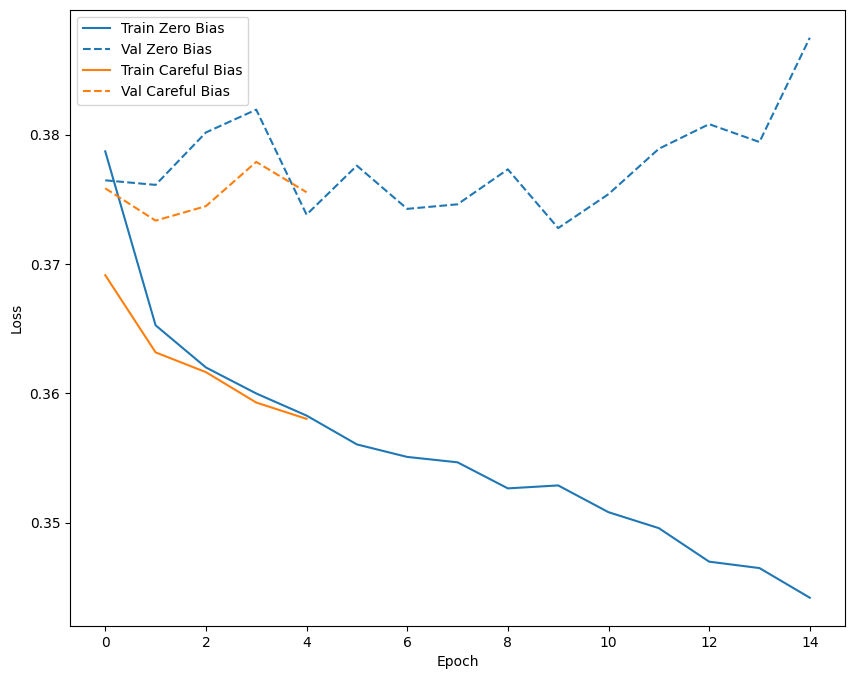

In [110]:
plot_loss(zero_bias_history,'Zero Bias',0)
plot_loss(careful_bias_history,'Careful Bias',1)

#### Train the model

In [ ]:
model = ANN_model()
model.load_weights(initial_weights)
baseline_history = model.fit(x_train,y_train,epochs=EPOCHS,batch_size=BATCH_SIZE,callbacks=[callback],validation_data=(x_val,y_val),verbose=1)

Epoch 1/500
1126/1126 [==============================] - 3s 1ms/step - loss: 0.3668 - tp: 9895.0000 - fp: 1355.0000 - tn: 0.0000e+00 - fn: 3.0000 - accuracy: 0.8793 - precision: 0.8796 - recall: 0.9997 - auc: 0.5480 - prc: 0.8974 - val_loss: 0.3741 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5623 - val_prc: 0.8980
Epoch 2/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.3613 - tp: 7927.0000 - fp: 1075.0000 - tn: 0.0000e+00 - fn: 0.0000e+00 - accuracy: 0.8806 - precision: 0.8806 - recall: 1.0000 - auc: 0.5802 - prc: 0.9094 - val_loss: 0.3747 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5658 - val_prc: 0.8989
Epoch 3/500
1126/1126 [==============================] - 1s 996us/step - loss: 0.3585 - tp: 7927.0000 - fp: 1075.0000 - tn: 0.00

#### Check training history

In [ ]:
def plot_metrics(history):
  metrics=['loss','accuracy','precision','recall','prc','auc']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.subplot(3,2,n+1)
    plt.plot(history.epoch, history.history[metric], color=colors[0], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
             color=colors[1], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    plt.legend()
    plt.subplots_adjust(wspace=0.5,hspace=0.5)

    if metric in ['precision','auc','accuracy','prc'] :
      plt.ylim([0.50,plt.ylim()[1]])
    elif metric=='loss':
      plt.ylim([0.3,plt.ylim()[1]])
    else:
      plt.ylim([plt.ylim()[0],plt.ylim()[1]])

  plt.show()

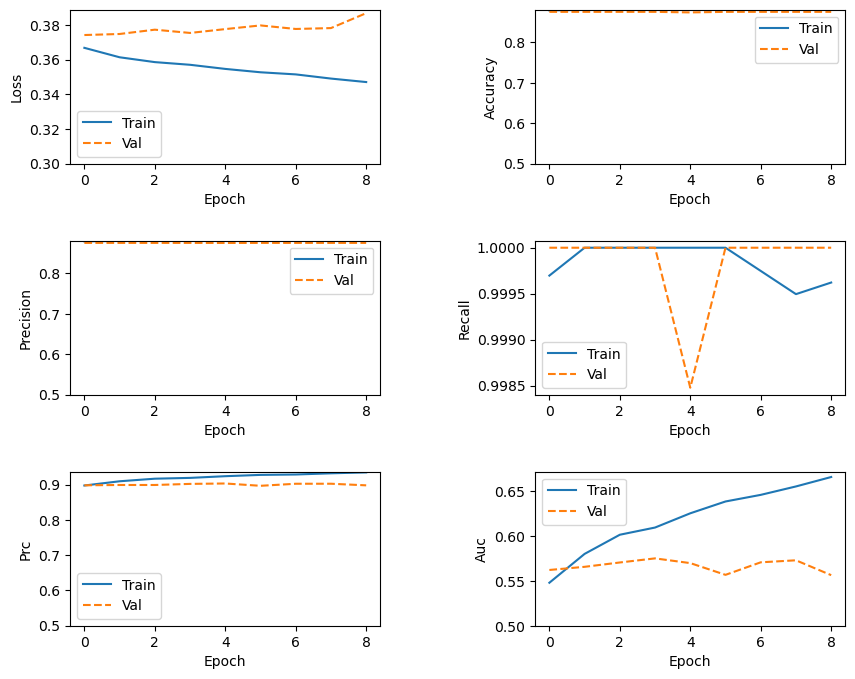

In [ ]:
plot_metrics(baseline_history)

#### Evaluate metrics

In [ ]:
train_predictions_baseline = model.predict(x_train,batch_size=BATCH_SIZE)
test_predictions_baseline = model.predict(x_test,batch_size=BATCH_SIZE)

352/352 [==============================] - 0s 560us/step


In [ ]:
def plot_cm(labels, predictions, threshold=0.5):
  cm = confusion_matrix(labels, predictions > threshold)
  plt.figure(figsize=(5,5))
  sns.heatmap(cm, annot=True, fmt="d")
  plt.title('Confusion matrix @{:.2f}'.format(threshold))
  plt.ylabel('Actual label')
  plt.xlabel('Predicted label')

  print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
  print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
  print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
  print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
  print('Total Fraudulent Transactions: ', np.sum(cm[1]))

loss :  0.3798372149467468
tp :  2465.0
fp :  349.0
tn :  0.0
fn :  0.0
accuracy :  0.8759772777557373
precision :  0.8759772777557373
recall :  1.0
auc :  0.5246930122375488
prc :  0.8874145150184631

Legitimate Transactions Detected (True Negatives):  0
Legitimate Transactions Incorrectly Detected (False Positives):  349
Fraudulent Transactions Missed (False Negatives):  0
Fraudulent Transactions Detected (True Positives):  2465
Total Fraudulent Transactions:  2465


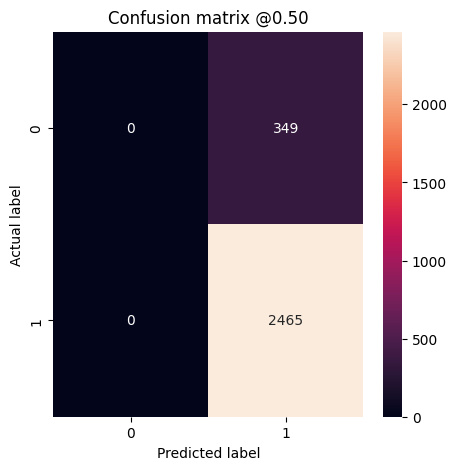

In [ ]:
baseline_results = model.evaluate(x_test,y_test,batch_size=BATCH_SIZE,verbose=0)
for name, value in zip(model.metrics_names, baseline_results):
  print(name, ': ', value)
print()

plot_cm(y_test, test_predictions_baseline)

#### Plot the ROC

In [ ]:
def plot_roc(name, labels, predictions, **kwargs):
  fp, tp, _ = roc_curve(labels, predictions)

  plt.plot(100*fp, 100*tp, label=name, linewidth=2, **kwargs)
  plt.xlabel('False positives [%]')
  plt.ylabel('True positives [%]')
  plt.xlim([-0.5,100])
  plt.ylim()
  plt.grid(True)
  ax = plt.gca()
  ax.set_aspect('equal')

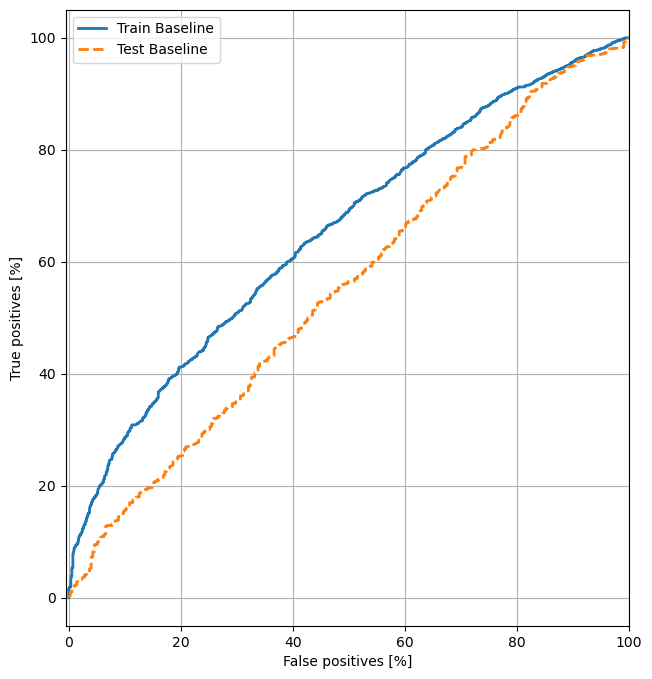

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[1], linestyle='--')
plt.legend()

#### Plot the PRC

In [ ]:
def plot_prc(name, labels, predictions, **kwargs):
    precision, recall, _ = precision_recall_curve(labels, predictions)
    
    plt.plot(precision, recall, label=name, linewidth=2, **kwargs)
    plt.xlim([-0.05,1.0])
    plt.ylim([-0.05,1.0])
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.grid(True)
    ax = plt.gca()
    ax.set_aspect('equal')

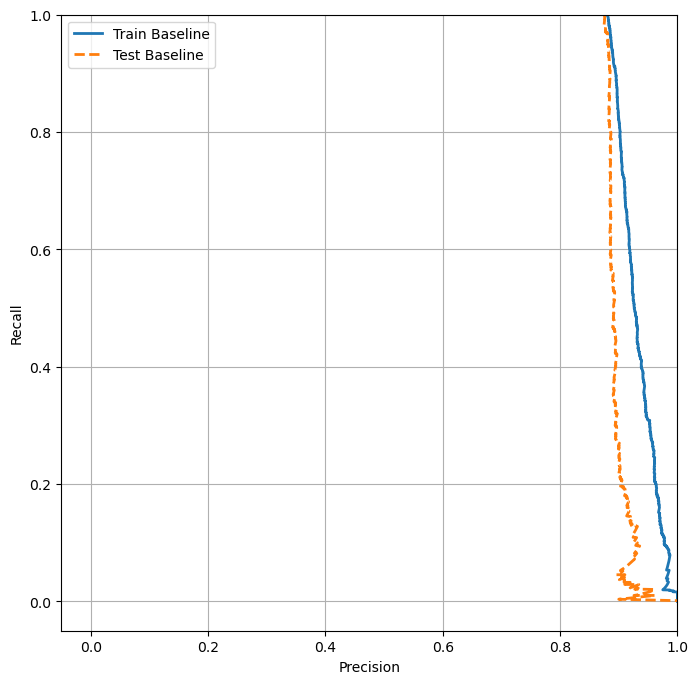

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[1], linestyle='--')
plt.legend()

#### calculate class weights

In [ ]:
# weight_for_0 = (1/neg)*(total/2.0)
# weight_for_1 = (1/pos)*(total/2.0)
weight_for_0 = 2.0
weight_for_1 = 0.5

class_weight = {0:weight_for_0,1:weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))


Weight for class 0: 2.00
Weight for class 1: 0.50


#### Train a model with class weights

In [ ]:
weighted_model = ANN_model()
weighted_model.load_weights(initial_weights)

weighted_history = weighted_model.fit(x_train,y_train,epochs=EPOCHS,
                                      batch_size=BATCH_SIZE,callbacks=[callback],
                                      validation_data=(x_val,y_val),
                                      class_weight=class_weight,verbose=1)

Epoch 1/500
1126/1126 [==============================] - 3s 1ms/step - loss: 0.4487 - tp: 10006.0000 - fp: 1359.0000 - tn: 65.0000 - fn: 386.0000 - accuracy: 0.8523 - precision: 0.8804 - recall: 0.9629 - auc: 0.5264 - prc: 0.8884 - val_loss: 0.4441 - val_tp: 1971.0000 - val_fp: 280.0000 - val_tn: 0.0000e+00 - val_fn: 0.0000e+00 - val_accuracy: 0.8756 - val_precision: 0.8756 - val_recall: 1.0000 - val_auc: 0.5525 - val_prc: 0.8972
Epoch 2/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.4348 - tp: 7736.0000 - fp: 1033.0000 - tn: 42.0000 - fn: 191.0000 - accuracy: 0.8640 - precision: 0.8822 - recall: 0.9759 - auc: 0.5760 - prc: 0.9093 - val_loss: 0.5472 - val_tp: 1786.0000 - val_fp: 255.0000 - val_tn: 25.0000 - val_fn: 185.0000 - val_accuracy: 0.8045 - val_precision: 0.8751 - val_recall: 0.9061 - val_auc: 0.5441 - val_prc: 0.8951
Epoch 3/500
1126/1126 [==============================] - 1s 1ms/step - loss: 0.4293 - tp: 7652.0000 - fp: 1019.0000 - tn: 56.0000 - fn: 27

#### Check training history

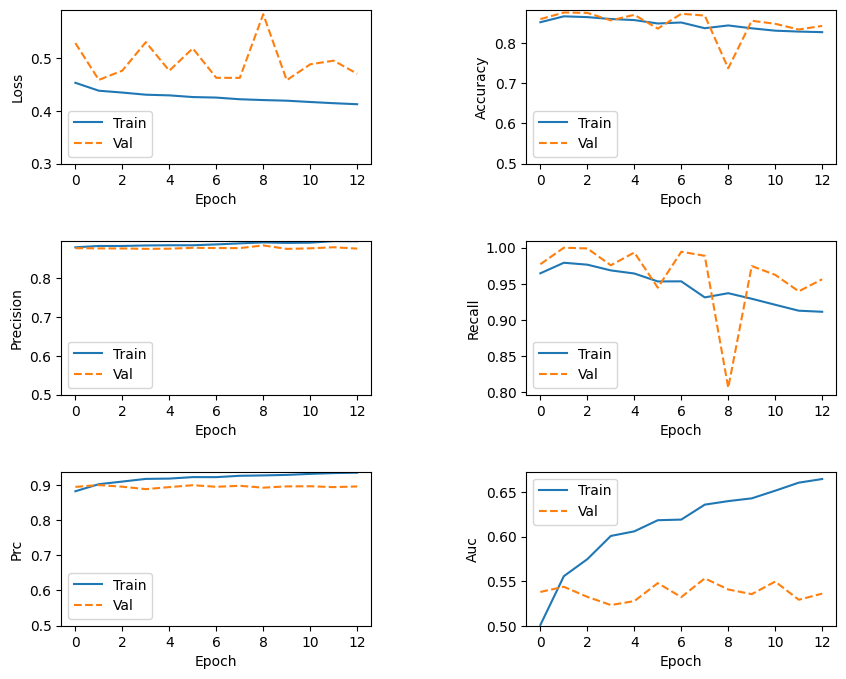

In [ ]:
plot_metrics(weighted_history)

#### Evaluate metrics

In [ ]:
train_predictions_weighted = weighted_model.predict(x_train,batch_size=BATCH_SIZE)
test_predictions_weighted = weighted_model.predict(x_test,batch_size=BATCH_SIZE)

352/352 [==============================] - 0s 542us/step


loss :  0.4681003987789154
tp :  2425.0
fp :  341.0
tn :  8.0
fn :  40.0
accuracy :  0.8646055459976196
precision :  0.8767172694206238
recall :  0.9837728142738342
auc :  0.5307154655456543
prc :  0.8924912810325623

Legitimate Transactions Detected (True Negatives):  8
Legitimate Transactions Incorrectly Detected (False Positives):  341
Fraudulent Transactions Missed (False Negatives):  40
Fraudulent Transactions Detected (True Positives):  2425
Total Fraudulent Transactions:  2465


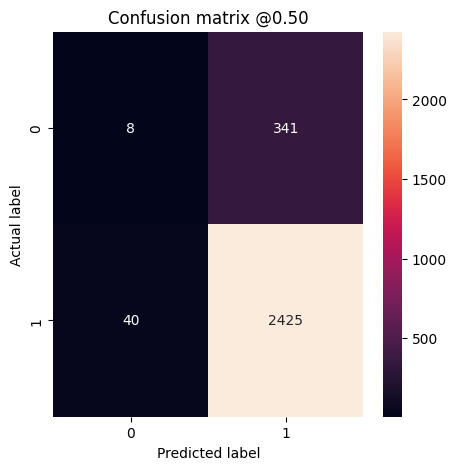

In [ ]:
weighted_results = weighted_model.evaluate(x_test,y_test,batch_size=BATCH_SIZE,verbose=0)
for name, value in zip(weighted_model.metrics_names, weighted_results):
  print(name, ': ', value)
print()

plot_cm(y_test, test_predictions_weighted)

#### Plot the ROC

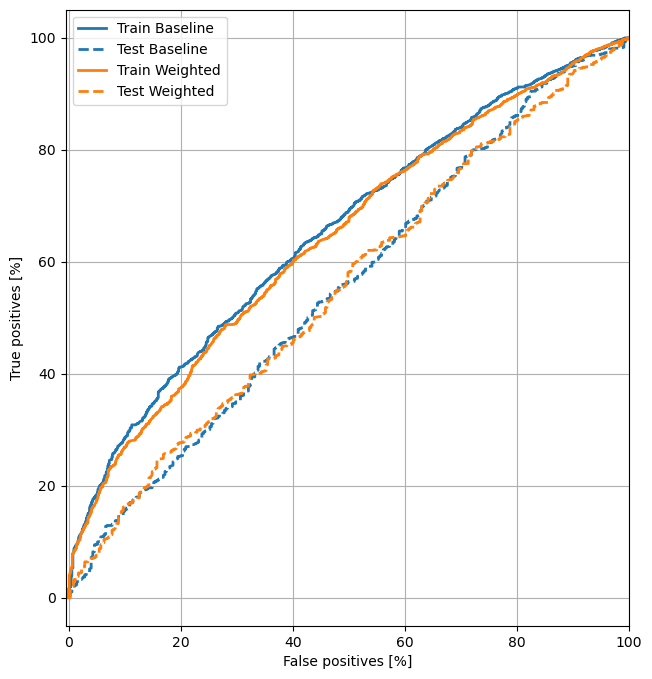

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_roc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_roc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')


plt.legend()

#### Plot the PRC

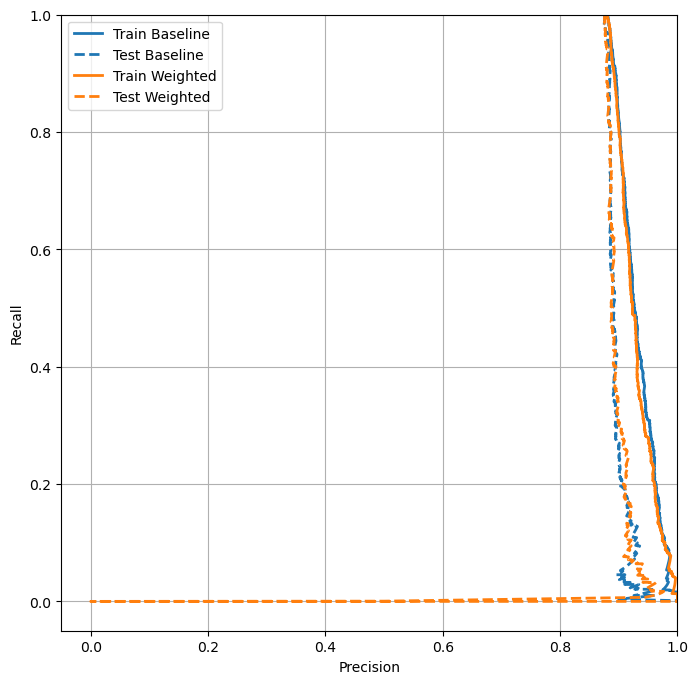

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_prc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_prc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')


plt.legend()

#### oversample the minority class

In [111]:
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaler, y)


In [112]:
x_resampled = pd.DataFrame(x_resampled,columns=feature_name)

#### check the distribution

In [113]:
y_resampled.value_counts()

survive
1    12363
0    12363
Name: count, dtype: int64

#### split the data

In [114]:
x_train_resampled, x_test_resampled, y_train_resampled, y_test_resampled = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)
x_train_resampled, x_val_resampled, y_train_resampled, y_val_resampled = train_test_split(x_train_resampled,y_train_resampled,test_size=0.2,random_state=42)

#### Train on the oversampled data

In [115]:
resampled_model = ANN_model()
resampled_model.load_weights(initial_weights)
# reset the bias to zero, since the dataset is balanced
output_layer = resampled_model.layers[-1]
output_layer.bias.assign([0])

resampled_model.summary()

C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  the `kernel` weights matrix.


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_20 (Dense)                │ (None, 34)             │           612 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 34)             │         1,190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            35 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,027 (11.82 KB)

 Trainable params: 3,027 (11.82 KB)

 Non-trainable params: 0 (0.00 B)

In [116]:
resampled_history = resampled_model.fit(x_train_resampled,y_train_resampled,epochs=EPOCHS,
                              batch_size=BATCH_SIZE,verbose=1,
                              callbacks=[callback],validation_data=(x_val_resampled,y_val_resampled))

Epoch 1/500


1978/1978 ━━━━━━━━━━━━━━━━━━━━ 3s 957us/step - accuracy: 0.6437 - auc: 0.6811 - fn: 1764.4088 - fp: 2081.1440 - loss: 0.6904 - prc: 0.7798 - precision: 0.6885 - recall: 0.7350 - tn: 2112.6641 - tp: 4212.7793 - val_accuracy: 0.5956 - val_auc: 0.6342 - val_fn: 973.0000 - val_fp: 627.0000 - val_loss: 0.6650 - val_prc: 0.6417 - val_precision: 0.6134 - val_recall: 0.5056 - val_tn: 1361.0000 - val_tp: 995.0000
Epoch 2/500
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 2s 766us/step - accuracy: 0.5927 - auc: 0.6298 - fn: 1829.5012 - fp: 1405.3826 - loss: 0.6643 - prc: 0.6391 - precision: 0.6092 - recall: 0.5316 - tn: 2516.7747 - tp: 2168.3376 - val_accuracy: 0.6016 - val_auc: 0.6515 - val_fn: 1024.0000 - val_fp: 552.0000 - val_loss: 0.6523 - val_prc: 0.6657 - val_precision: 0.6310 - val_recall: 0.4797 - val_tn: 1436.0000 - val_tp: 944.0000
Epoch 3/500
1978/1978 ━━━━━━━━━━━━━━━━━━━━ 1s 747us/step - accuracy: 0.6152 - auc: 0.6661 - fn: 1718.0208 - fp: 1338.5043 - loss: 0.6474 - prc: 0.6765 - precision: 0.6310 

#### check training history

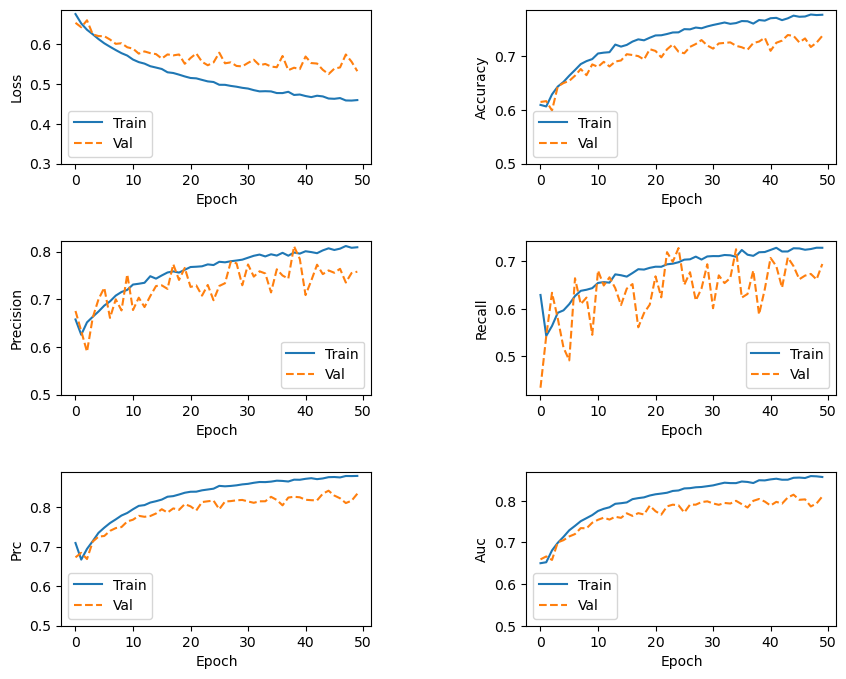

In [ ]:
plot_metrics(resampled_history)

#### evaluate metrics

In [117]:
y_train_pred_resampled = resampled_model.predict(x_train_resampled,batch_size=BATCH_SIZE)
y_test_pred_resampled = resampled_model.predict(x_test_resampled,batch_size=BATCH_SIZE)

1978/1978 ━━━━━━━━━━━━━━━━━━━━ 1s 343us/step
619/619 ━━━━━━━━━━━━━━━━━━━━ 0s 375us/step


loss :  0.5449016094207764
tp :  1523.0
fp :  459.0
tn :  2058.0
fn :  906.0
accuracy :  0.7240194082260132
precision :  0.7684157490730286
recall :  0.627007007598877
auc :  0.796731173992157
prc :  0.8169111609458923

Legitimate Transactions Detected (True Negatives):  2058
Legitimate Transactions Incorrectly Detected (False Positives):  459
Fraudulent Transactions Missed (False Negatives):  906
Fraudulent Transactions Detected (True Positives):  1523
Total Fraudulent Transactions:  2429


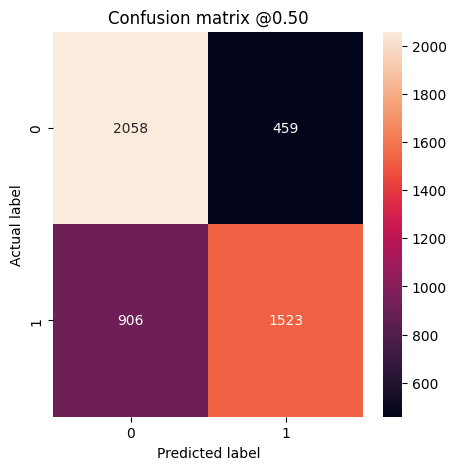

In [ ]:
resampled_results = resampled_model.evaluate(x_test_resampled, y_test_resampled,batch_size=BATCH_SIZE, verbose=0)
for name, value in zip(resampled_model.metrics_names, resampled_results):
  print(name, ': ', value)
print()

plot_cm(y_test_resampled, y_test_pred_resampled)

#### plot the ROC

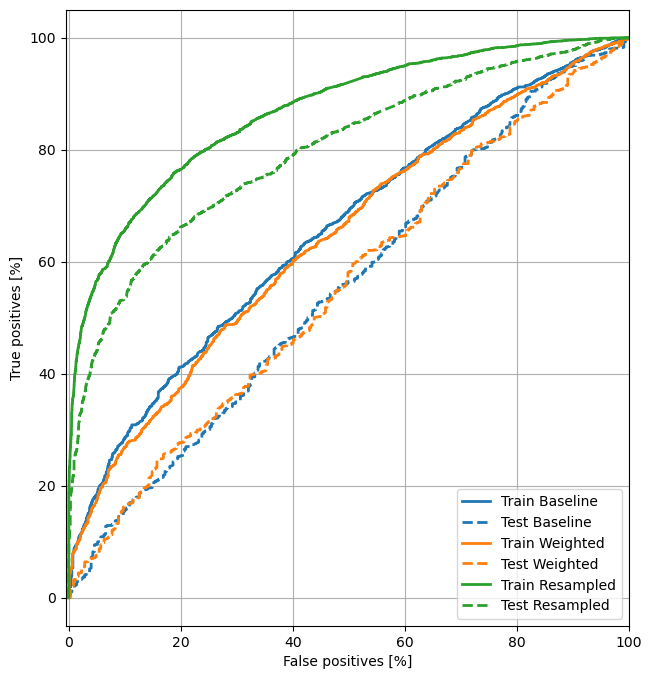

In [ ]:
plot_roc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_roc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')
plot_roc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_roc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')
plot_roc("Train Resampled", y_train_resampled, y_train_pred_resampled, color=colors[2])
plot_roc("Test Resampled", y_test_resampled, y_test_pred_resampled, color=colors[2], linestyle='--')
plt.legend(loc='lower right')

#### plot the AUPRC

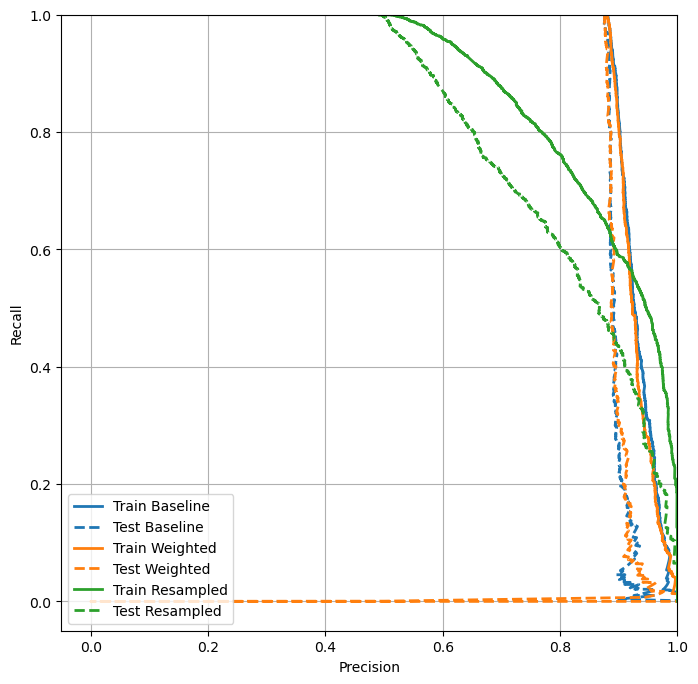

In [ ]:
plot_prc("Train Baseline", y_train, train_predictions_baseline, color=colors[0])
plot_prc("Test Baseline", y_test, test_predictions_baseline, color=colors[0], linestyle='--')

plot_prc("Train Weighted", y_train, train_predictions_weighted, color=colors[1])
plot_prc("Test Weighted", y_test, test_predictions_weighted, color=colors[1], linestyle='--')

plot_prc("Train Resampled", y_train_resampled, y_train_pred_resampled, color=colors[2])
plot_prc("Test Resampled", y_test_resampled, y_test_pred_resampled, color=colors[2], linestyle='--')

plt.legend(loc='lower left')

#### save model

In [126]:
# serialize weights to HDF5
resampled_model.save_weights(save_path + "model_ANN_weight.weights.h5")
# save model as h5
resampled_model.save(save_path + "model_ANN.h5")
resampled_model.save(save_path+"model_ANN.keras")

### Logistic Regression model

In [32]:
# import libraries
import os
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer

# function to load x
def load_x(data_path):
    df_x = pd.read_csv(data_path)
    # return the 7th and the second last column of the test data
    df_x = df_x.iloc[:,7:-1]
    # fill the missing data with the mean of the column
    df_x.loc[df_x['median_hs_income']=='**', 'median_hs_income'] = np.nan
    df_x['median_hs_income'] = df_x['median_hs_income'].astype(float)
    columns = [x for x in df_x.columns]
    impute = KNNImputer()
    df_x = impute.fit_transform(df_x)
    df_x = pd.DataFrame(df_x,columns=columns)
    return df_x

# function to load y
def load_y(data_path):
    df_y = pd.read_csv(data_path)
    df_y = df_y.iloc[:,-1]
    # fill the missing data with the mode of the column
    df_y = df_y.fillna(df_y.mode())
    return df_y

# for this group project, we use 'data\Master\RL.csv' for training model
# load the data
x = load_x('data/Master/RL.csv')

# load the target column
y = load_y('data/Master/RL.csv')

# Standard scaling the data, except the target column
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

In [33]:
# Train logistic regression model without oversampling
x_train, x_test, y_train, y_test = train_test_split(x_scaler, y, test_size=0.2, random_state=42)
logistic_1 = LogisticRegression()
logistic_1.fit(x_train, y_train)

LogisticRegression()

In [34]:
# oversample the minority class
smote = SMOTE(random_state=42)
x_resampled, y_resampled = smote.fit_resample(x_scaler, y)

# split the data
x_train_resampled, x_test_resampled, y_train_resampled, y_test_resampled = train_test_split(x_resampled,y_resampled,test_size=0.2,random_state=42)

# Train on the oversampled data with Logistic Regression
logistic_2 = LogisticRegression()
logistic_2.fit(x_train_resampled, y_train_resampled)

LogisticRegression()

In [39]:
# export the logistic regression model
import joblib
joblib.dump(logistic_1, 'model/logistic_regression_model_1.pkl')
joblib.dump(logistic_2, 'model/logistic_regression_model_2.pkl')

['model/logistic_regression_model_2.pkl']

In [36]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# set-up color
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# confusion matrix
def plot_cm(labels, predictions, threshold=0.5):
    cm = confusion_matrix(labels, predictions > threshold)
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt="d")
    plt.title('Confusion matrix @{:.2f}'.format(threshold))
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')

    print('Legitimate Transactions Detected (True Negatives): ', cm[0][0])
    print('Legitimate Transactions Incorrectly Detected (False Positives): ', cm[0][1])
    print('Fraudulent Transactions Missed (False Negatives): ', cm[1][0])
    print('Fraudulent Transactions Detected (True Positives): ', cm[1][1])
    print('Total Fraudulent Transactions: ', np.sum(cm[1]))

Legitimate Transactions Detected (True Negatives):  0
Legitimate Transactions Incorrectly Detected (False Positives):  349
Fraudulent Transactions Missed (False Negatives):  0
Fraudulent Transactions Detected (True Positives):  2465
Total Fraudulent Transactions:  2465


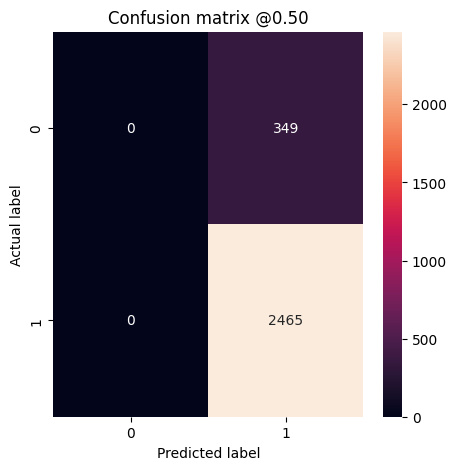

In [37]:
# plot confusion matrix for logistic regression model 1
y_test_pred_1 = logistic_1.predict(x_test)
plot_cm(y_test, y_test_pred_1)

Legitimate Transactions Detected (True Negatives):  1419
Legitimate Transactions Incorrectly Detected (False Positives):  1098
Fraudulent Transactions Missed (False Negatives):  1165
Fraudulent Transactions Detected (True Positives):  1264
Total Fraudulent Transactions:  2429


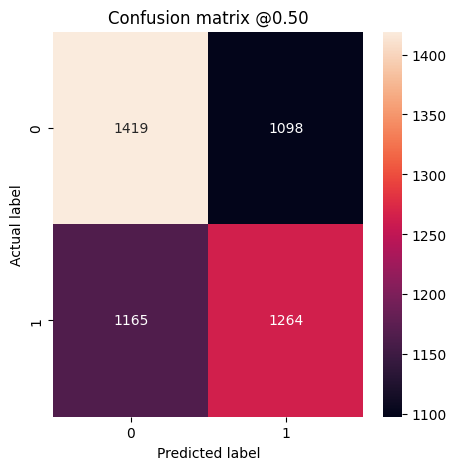

In [40]:
# plot confusion matrix for logistic regression model 2
y_test_pred_2 = logistic_2.predict(x_test_resampled)
plot_cm(y_test_resampled, y_test_pred_2)

ROC AUC for Logistic Regression Model 1: 0.5499851793301057
ROC AUC for Logistic Regression Model 2: 0.545578252322249


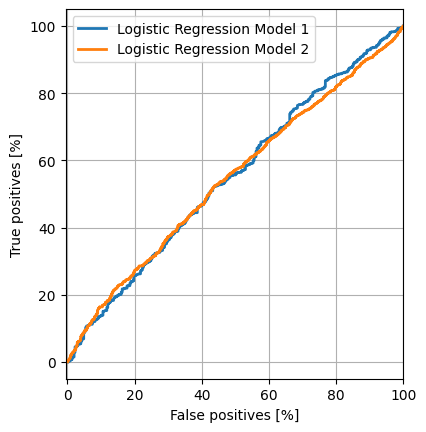

In [50]:
# plot ROC curve for logistic regression model 1 and logistic regression model 2
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

## Plot the ROC
def plot_roc(name, labels, predictions, **kwargs):
  fp, tp, _ = roc_curve(labels, predictions)

  plt.plot(100*fp, 100*tp, label=name, linewidth=2, **kwargs)
  plt.xlabel('False positives [%]')
  plt.ylabel('True positives [%]')
  plt.xlim([-0.5,100])
  plt.ylim()
  plt.grid(True)
  ax = plt.gca()
  ax.set_aspect('equal')

# plot the roc curve for logistic regression model 1 and logistic regression model 2
plot_roc("Logistic Regression Model 1", y_test, y_test_pred_prob_1, color=colors[0])
plot_roc("Logistic Regression Model 2", y_test_resampled, y_test_pred_prob_2, color=colors[1])

# calculate the roc auc
roc_auc_1 = roc_auc_score(y_test, y_test_pred_prob_1)
roc_auc_2 = roc_auc_score(y_test_resampled, y_test_pred_prob_2)
print(f'ROC AUC for Logistic Regression Model 1: {roc_auc_1}')
print(f'ROC AUC for Logistic Regression Model 2: {roc_auc_2}')

AUPRC for Logistic Regression Model 1: 0.892
AUPRC for Logistic Regression Model 2: 0.542


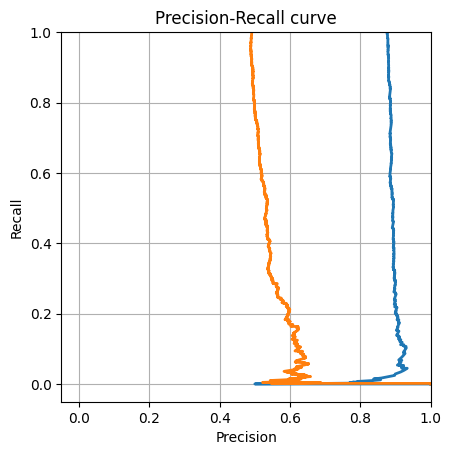

In [55]:
from sklearn.metrics import average_precision_score

# function to plot auprc
def plot_prc(name, labels, predictions, **kwargs):
    precision, recall, _ = precision_recall_curve(labels, predictions)
    
    plt.plot(precision, recall, label=name, linewidth=2, **kwargs)
    plt.xlim([-0.05,1.0])
    plt.ylim([-0.05,1.0])
    plt.xlabel('Precision')
    plt.ylabel('Recall')
    plt.grid(True)
    ax = plt.gca()
    ax.set_aspect('equal')
    
# plot the AUPRC for logistic regression model 1 and logistic regression model 2
plot_prc("Logistic Regression Model 1", y_test, y_test_pred_prob_1, color=colors[0])
plot_prc("Logistic Regression Model 2", y_test_resampled, y_test_pred_prob_2, color=colors[1])
plt.title('Precision-Recall curve')

# calculate the auprc
auprc_1 = average_precision_score(y_test, y_test_pred_prob_1)
auprc_2 = average_precision_score(y_test_resampled, y_test_pred_prob_2)
print('AUPRC for Logistic Regression Model 1: %.3f' % auprc_1)
print('AUPRC for Logistic Regression Model 2: %.3f' % auprc_2)

In [60]:
# calculate loss, true possitive, false possitive, true negative, false negative, accuracy, precision, recall, auc, prc for logistic regression model 2
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_auc_score, precision_recall_curve, auc
from sklearn.metrics import log_loss

loss = log_loss(y_test_resampled, y_test_pred_prob_2, eps=1e-15) 

true_positive = confusion_matrix(y_test_resampled, y_test_pred_2)[1,1]
false_positive = confusion_matrix(y_test_resampled, y_test_pred_2)[0,1]
true_negative = confusion_matrix(y_test_resampled, y_test_pred_2)[0,0]
false_negative = confusion_matrix(y_test_resampled, y_test_pred_2)[1,0]
accuracy = accuracy_score(y_test_resampled, y_test_pred_2)
precision = precision_score(y_test_resampled, y_test_pred_2)
recall = recall_score(y_test_resampled, y_test_pred_2)
roc_auc = roc_auc_score(y_test_resampled, y_test_pred_2)

print('Logistic Regression Model 2 performance:')
print(f'Loss: {loss}')
print(f'True Positive: {true_positive}')
print(f'False Positive: {false_positive}')
print(f'True Negative: {true_negative}')
print(f'False Negative: {false_negative}')
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'AUC: {roc_auc}')

Logistic Regression Model 2 performance:
Loss: 0.6904201427283352
True Positive: 1264
False Positive: 1098
True Negative: 1419
False Negative: 1165
Accuracy: 0.542458552365548
Precision: 0.5351397121083827
Recall: 0.5203787566899959
AUC: 0.5420725726239015


C:\Users\kwokt\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:2910: FutureWarning: Setting the eps parameter is deprecated and will be removed in 1.5. Instead eps will always havea default value of `np.finfo(y_pred.dtype).eps`.
  warnings.warn(


### Model performance comparasion:

#### ANN

* loss :  0.5492171049118042
* tp :  1627.0
* fp :  542.0
* tn :  1975.0
* fn :  802.0
* accuracy :  0.7282652854919434
* precision :  0.7501152753829956
* recall :  0.6698229908943176
* auc :  0.7959793210029602


#### Logistic regression:

* Loss: 0.6904201427283352
* True Positive: 1264
* False Positive: 1098
* True Negative: 1419
* False Negative: 1165
* Accuracy: 0.542458552365548
* Precision: 0.5351397121083827
* Recall: 0.5203787566899959
* AUC: 0.5420725726239015

ANN perform better, as it has a higher auc score, accuracy, 

# Findings: features important of ANN model

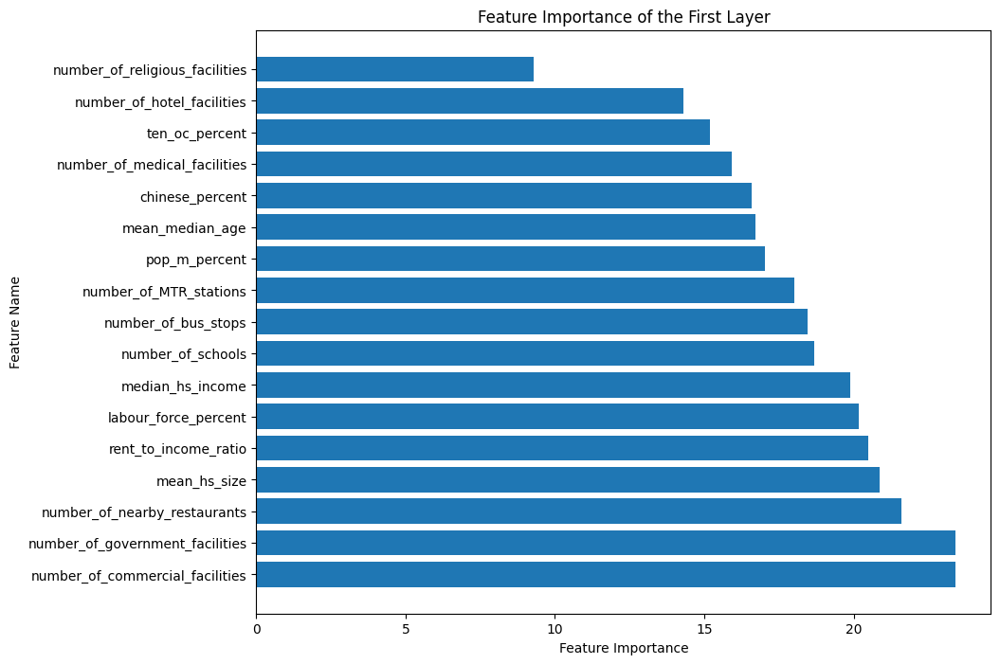

In [ ]:
# get the weights of the first layer
weights = resampled_model.layers[0].get_weights()[0]

# calculate the feature importance
feature_importance = abs(weights).sum(axis=1)

# sort the feature importance in descending order
sorted_indices = feature_importance.argsort()[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_name = feature_name[sorted_indices]

# plot the feature importance(bar plot)
plt.figure(figsize=(10,8))
plt.barh(sorted_feature_name,sorted_feature_importance)
plt.yticks(range(len(sorted_feature_name)),sorted_feature_name)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importance of the First Layer')
plt.show()



155/155 [==============================] - 0s 2ms/step


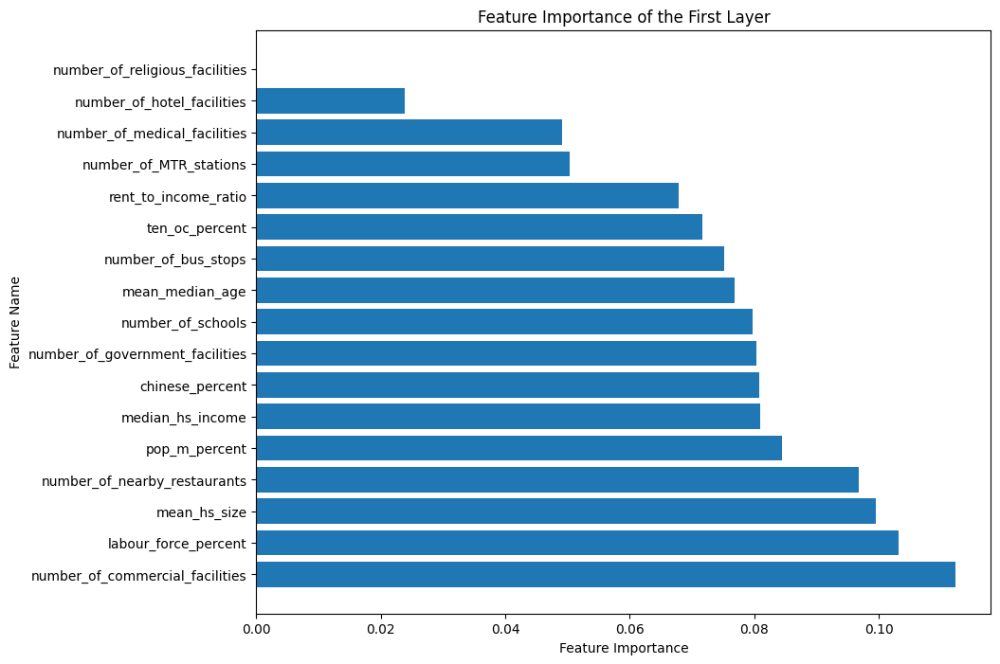

In [ ]:
def score(x,y):
    y_pred = resampled_model.predict(x)
    return accuracy_score(y,y_pred>0.5)

base_score,score_decrease = get_score_importances(score,x_test_resampled.values,y_test_resampled.values,random_state=42)
feature_importance = np.mean(score_decrease,axis=0)

sorted_indices = feature_importance.argsort()[::-1]
sorted_feature_importance = feature_importance[sorted_indices]
sorted_feature_name = feature_name[sorted_indices]

plt.figure(figsize=(10,8))
plt.barh(sorted_feature_name,sorted_feature_importance)
plt.yticks(range(len(sorted_feature_name)),sorted_feature_name)
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Feature Importance of the First Layer')
plt.show()


In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 6.6 MB/s eta 0:00:00


In [ ]:
import shap
import tensorflow as tf

# change to numpy format
x_train_values = x_train_resampled.values if isinstance(x_train_resampled, pd.DataFrame) else x_train_resampled
x_test_values = x_test_resampled.values if isinstance(x_test_resampled, pd.DataFrame) else x_test_resampled

# use model to create explainer
explainer = shap.DeepExplainer(resampled_model, x_train_values[:100])

# calculate shap_values
shap_values = explainer.shap_values(x_test_values[:50])

# choose a sample
sample_index = 0
sample_shap_values = shap_values[sample_index,:,0]
sample_features = x_test_values[sample_index]

# assert same shape
assert sample_shap_values.shape[0] == sample_features.shape[0]

# initial
shap.initjs()

# change expected_value
expected_value = explainer.expected_value
if isinstance(expected_value, tf.Tensor):
    expected_value = expected_value.numpy()

if isinstance(expected_value, list):
    expected_value = expected_value[0]

shap.force_plot(expected_value, sample_shap_values, feature_name)

/usr/local/lib/python3.10/dist-packages/shap/explainers/_deep/deep_tf.py:99: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn("Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.")
/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


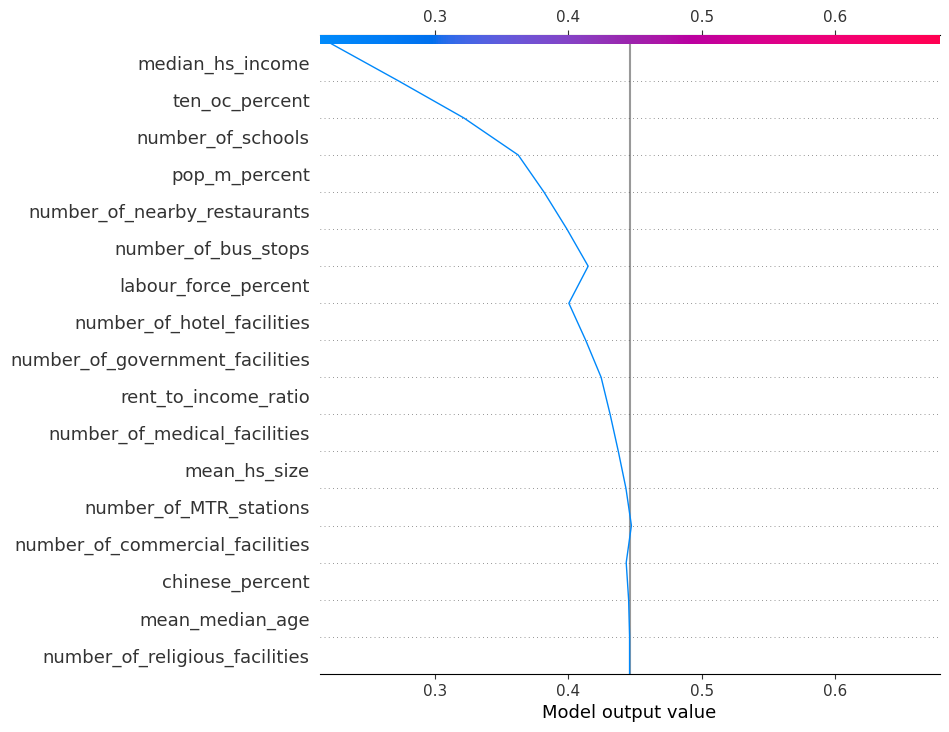

In [ ]:
# create decision_plot
shap.decision_plot(expected_value, sample_shap_values, feature_name)


In [ ]:
# print result of shap_values
for name, value in zip(feature_name, sample_shap_values):
    print(f"{name} = {value:.4f}")

number_of_nearby_restaurants = -0.0172
number_of_bus_stops = -0.0159
number_of_MTR_stations = -0.0041
number_of_schools = -0.0408
number_of_commercial_facilities = 0.0039
number_of_government_facilities = -0.0116
number_of_religious_facilities = 0.0000
number_of_medical_facilities = -0.0062
number_of_hotel_facilities = -0.0127
mean_median_age = -0.0007
median_hs_income = -0.0503
mean_hs_size = -0.0057
labour_force_percent = 0.0145
chinese_percent = -0.0018
pop_m_percent = -0.0193
ten_oc_percent = -0.0491
rent_to_income_ratio = -0.0068


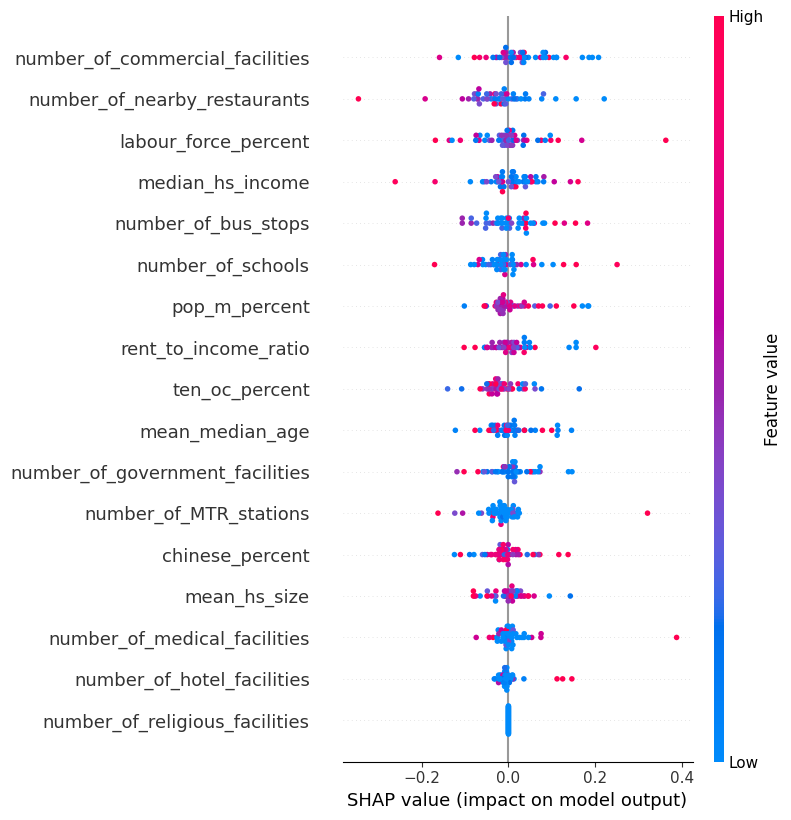

In [ ]:
# create summary_plot
shap.summary_plot(shap_values[:,:,0], x_test_resampled[:50], feature_names=feature_name)

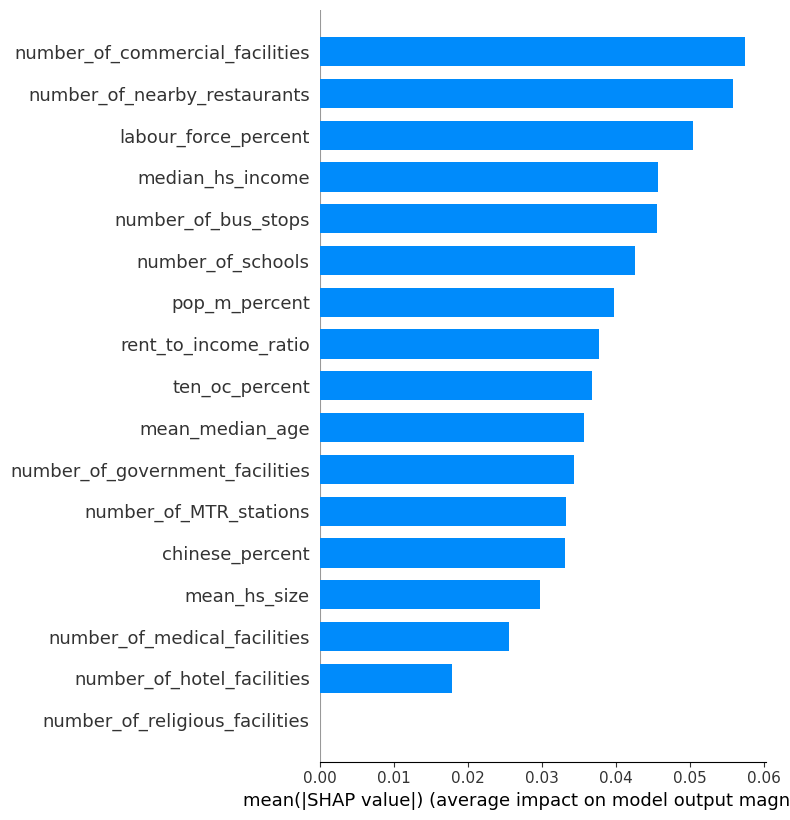

In [ ]:
# create barplot
shap_values_for_output = shap_values[:,:,0]
shap_sum = np.abs(shap_values_for_output).mean(axis=0)
shap.summary_plot(shap_values_for_output, x_test_resampled[:50], plot_type="bar", feature_names=feature_name)